In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/campus-placement-prediction/campus_placement_data.csv


In [2]:
print("🎓✨ **Welcome to the Campus Placement Insights Project!** ✨🎓")
print("\n🌟 **Introduction** 🌟")

print("\n📋 **Dataset Description** 📋")
print("The 'campus_placement_data.csv' dataset is a treasure trove of information on 100,000 students from various backgrounds. It includes 26 columns capturing academic, skill-based, and experiential attributes. Here's a breakdown:")
print("- **Personal Info**: Gender (Male, Female, Other), Age (18-26 years), City Tier (Tier 1, 2, 3) 🏙️")
print("- **Academic Background**: SSC Percentage (40-100%), SSC Board (CBSE, ICSE, State); HSC Percentage (40-100%), HSC Board (same); HSC Stream (Commerce, Science, Arts) 📚")
print("- **Higher Education**: Degree Percentage (45-100%), Degree Field (Engineering, Business, Other, Arts, Science); MBA Percentage (0-100%), Specialization (None, Marketing & Finance, Finance & HR, Marketing & HR) 🎓")
print("- **Skill Development**: Internships Count (0-5), Projects Count (0-10), Certifications Count (0-8) 🛠️")
print("- **Scores**: Technical Skills (1-10), Soft Skills (1-10), Aptitude (0-100), Communication (1-10) 📈")
print("- **Experience & Activities**: Work Experience Months (0-36), Leadership Roles (0-5), Extracurricular Activities (0-10), Backlogs (0-10) 🌟")
print("- **Outcomes**: Placed (0 or 1, with 84,432 students placed), Salary in LPA (0-24.22) 💼💰")
print("This dataset provides a holistic view of student journeys, from school to job offers, making it ideal for analysis!")

print("\n❓ **Problem Framing** ❓")
print("The core challenge: **Predicting Placement Success and Salary**. In a world where campus recruitments are gateways to careers, can we identify key drivers of getting placed and earning higher salaries? 🏆")
print(" - **Classification Task**: Predict if a student will be 'placed' (1) or not (0) based on their profile. Useful for early interventions! 🔍")
print(" - **Regression Task**: Estimate 'salary_lpa' for placed students, helping set realistic expectations. 📉")
print("Potential questions: How do internships impact placement odds? Do city tiers affect salaries? Are soft skills more important than grades? 🤔")
print("By framing it this way, we can build ML models (e.g., Logistic Regression for placement, Random Forest for salary) and derive actionable insights. Let's turn data into destiny! 🌈🔮")

🎓✨ **Welcome to the Campus Placement Insights Project!** ✨🎓

🌟 **Introduction** 🌟

📋 **Dataset Description** 📋
The 'campus_placement_data.csv' dataset is a treasure trove of information on 100,000 students from various backgrounds. It includes 26 columns capturing academic, skill-based, and experiential attributes. Here's a breakdown:
- **Personal Info**: Gender (Male, Female, Other), Age (18-26 years), City Tier (Tier 1, 2, 3) 🏙️
- **Academic Background**: SSC Percentage (40-100%), SSC Board (CBSE, ICSE, State); HSC Percentage (40-100%), HSC Board (same); HSC Stream (Commerce, Science, Arts) 📚
- **Higher Education**: Degree Percentage (45-100%), Degree Field (Engineering, Business, Other, Arts, Science); MBA Percentage (0-100%), Specialization (None, Marketing & Finance, Finance & HR, Marketing & HR) 🎓
- **Skill Development**: Internships Count (0-5), Projects Count (0-10), Certifications Count (0-8) 🛠️
- **Scores**: Technical Skills (1-10), Soft Skills (1-10), Aptitude (0-100), Commu

In [9]:
# ────────────────────────────────────────────────────────────────
#          Campus Placement Data - Cleaning & Preprocessing
# ────────────────────────────────────────────────────────────────

import pandas as pd
import numpy as np

print("══════════════════════════════════════════════════════════════")
print("          STAGE 1 : DATA LOADING & BASIC INSPECTION           ")
print("══════════════════════════════════════════════════════════════\n")

# ─── Load the dataset ────────────────────────────────────────────
# Adjust path if needed
df = pd.read_csv("/kaggle/input/campus-placement-prediction/campus_placement_data.csv")

# ─── 1. Basic Information ────────────────────────────────────────
print("📊 df.info()")
print("-" * 60)
df.info()
print("\n")

# ─── 2. Statistical Summary ──────────────────────────────────────

print("📊 Categorical columns summary")
print("-" * 60)
cat_cols = df.select_dtypes(include=['object']).columns
for col in cat_cols:
    print(f"\n{col}:")
    print(df[col].value_counts(dropna=False).head(8))
    print("-" * 40)

# ─── 3. Missing Values Check ─────────────────────────────────────
print("\n🔍 MISSING VALUES REPORT")
print("-" * 60)
missing = df.isnull().sum()
missing_pct = (missing / len(df) * 100).round(2)
missing_report = pd.DataFrame({
    'Missing Count': missing,
    'Missing %': missing_pct
}).sort_values('Missing Count', ascending=False)
print(missing_report[missing_report['Missing Count'] > 0].to_string())
print("\n→ Total missing values:", missing.sum())
print("→ Rows with any missing value:", df.isnull().any(axis=1).sum())

print("\n")

# ────────────────────────────────────────────────────────────────
#          STAGE 2 : DATA CLEANING DECISIONS
# ────────────────────────────────────────────────────────────────

print("🧹 DATA CLEANING & PREPROCESSING STEPS")
print("-" * 60)

# 1. Handle missing values
print("1. Handling missing values...")

# For numerical columns - using median (robust to outliers)
num_cols_with_missing = ['ssc_percentage','hsc_percentage','degree_percentage',
                        'technical_skills_score','soft_skills_score',
                        'aptitude_score','communication_score']

for col in num_cols_with_missing:
    if df[col].isnull().any():
        df[col] = df[col].fillna(df[col].median())
        print(f"   → Filled {col} missing values with median")

# For categorical columns - using mode or a new category
cat_cols_with_missing = ['specialization']   # most common one that may have NaN

for col in cat_cols_with_missing:
    if df[col].isnull().any():
        df[col] = df[col].fillna(df[col].mode()[0])
        print(f"   → Filled {col} missing values with mode")

# If any critical column still has missing → drop those rows (rare)
df = df.dropna(subset=['placed'])   # very important target
print("   → Dropped rows where target 'placed' is missing (if any)")

# 2. Correct data types if needed
print("\n2. Converting data types where necessary...")
# Example: make sure percentages are float
percent_cols = ['ssc_percentage','hsc_percentage','degree_percentage','mba_percentage']
for col in percent_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# 3. Handle unrealistic/out-of-range values (if any)
print("\n3. Checking & clipping unrealistic values...")
# Example: percentages should be between 0-100
for col in percent_cols:
    invalid = (df[col] < 0) | (df[col] > 100)
    if invalid.any():
        print(f"   → Found {invalid.sum()} invalid values in {col}")
        df.loc[invalid, col] = np.clip(df.loc[invalid, col], 0, 100)

# Scores usually 0-10 or 0-100
df['technical_skills_score']  = df['technical_skills_score'].clip(0, 10)
df['soft_skills_score']       = df['soft_skills_score'].clip(0, 10)
df['communication_score']     = df['communication_score'].clip(0, 10)
df['aptitude_score']          = df['aptitude_score'].clip(0, 100)

# 4. Feature Engineering - basic new columns (you can expand later)
print("\n4. Creating useful derived features...")
df['total_projects_intern'] = df['projects_count'] + df['internships_count']
df['skill_score_avg']       = (df['technical_skills_score'] + df['soft_skills_score'] + df['communication_score']) / 3
df['academic_avg']          = (df['ssc_percentage'] + df['hsc_percentage'] + df['degree_percentage']) / 3

print("   → Added: total_projects_intern, skill_score_avg, academic_avg")

# 5. Final check
print("\n" + "="*60)
print("FINAL DATASET STATUS AFTER CLEANING")
print("="*60)
print(df.info())
print("\nMissing values after cleaning:")
print(df.isnull().sum().sum(), "remaining missing values")

print("\nReady for EDA / Model Building! 🚀")
print("Shape of cleaned dataset:", df.shape)

══════════════════════════════════════════════════════════════
          STAGE 1 : DATA LOADING & BASIC INSPECTION           
══════════════════════════════════════════════════════════════

📊 df.info()
------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   student_id                  100000 non-null  object 
 1   gender                      100000 non-null  object 
 2   age                         100000 non-null  int64  
 3   city_tier                   100000 non-null  object 
 4   ssc_percentage              100000 non-null  float64
 5   ssc_board                   100000 non-null  object 
 6   hsc_percentage              100000 non-null  float64
 7   hsc_board                   100000 non-null  object 
 8   hsc_stream                  100000 non-nul

In [7]:
df=pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')
df

,student_id,gender,age,city_tier,ssc_percentage,ssc_board,hsc_percentage,hsc_board,hsc_stream,degree_percentage,...,technical_skills_score,soft_skills_score,aptitude_score,communication_score,work_experience_months,leadership_roles,extracurricular_activities,backlogs,placed,salary_lpa
0,STU000001,Male,22,Tier 1,71.01,State,76.76,CBSE,Commerce,64.44,...,6.8,7.8,62.1,6.2,14,1,10,0,1,12.24
1,STU000002,Female,22,Tier 2,58.46,CBSE,57.62,State,Science,68.24,...,4.6,4.8,58.7,7.2,5,1,4,0,1,10.09
2,STU000003,Female,21,Tier 1,67.83,CBSE,65.67,State,Commerce,52.33,...,4.7,5.0,58.9,5.0,30,2,1,0,1,14.94
3,STU000004,Female,21,Tier 2,80.40,CBSE,77.15,State,Science,56.55,...,6.8,7.6,35.0,8.3,31,0,5,0,1,15.49
4,STU000005,Male,21,Tier 1,66.10,State,62.81,ICSE,Science,78.93,...,7.0,5.7,54.0,5.4,24,0,2,0,1,15.13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,STU099996,Female,22,Tier 1,70.03,CBSE,58.73,State,Arts,48.01,...,10.0,10.0,57.4,10.0,10,1,0,5,1,12.36
99996,STU099997,Female,22,Tier 2,81.48,CBSE,65.48,State,Commerce,45.00,...,6.0,8.4,56.5,9.2,7,2,4,0,1,10.64
99997,STU099998,Female,20,Tier 2,79.29,State,70.13,State,Commerce,75.24,...,6.6,7.0,38.0,7.1,10,1,4,1,1,13.05
99998,STU099999,Male,22,Tier 1,74.81,CBSE,74.79,CBSE,Commerce,92.22,...,4.9,8.2,81.3,8.3,0,1,4,0,1,12.52


In [8]:
df.describe()

,age,ssc_percentage,hsc_percentage,degree_percentage,mba_percentage,internships_count,projects_count,certifications_count,technical_skills_score,soft_skills_score,aptitude_score,communication_score,work_experience_months,leadership_roles,extracurricular_activities,backlogs,placed,salary_lpa
count,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,21.55581,71.929885,71.831667,70.185520,22.853134,1.677490,3.295290,1.896330,5.982618,6.413043,59.913595,6.374366,9.964250,1.108080,2.931890,1.045870,0.844320,9.708429
std,1.50696,11.867225,13.903709,15.599274,31.610435,1.306627,1.870414,1.775324,1.948801,2.292634,17.772688,2.385099,11.953415,1.207242,1.937578,1.614606,0.362554,4.783668
min,18.00000,40.000000,40.000000,45.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.00000,63.870000,62.120000,58.090000,0.000000,1.000000,2.000000,0.000000,4.600000,4.800000,47.900000,4.700000,0.000000,0.000000,2.000000,0.000000,1.000000,8.510000
50%,21.00000,71.920000,71.860000,69.890000,0.000000,1.000000,3.000000,1.000000,6.000000,6.500000,60.000000,6.500000,3.000000,1.000000,3.000000,0.000000,1.000000,10.710000
75%,22.00000,80.030000,81.720000,81.840000,59.330000,2.000000,4.000000,3.000000,7.300000,8.200000,72.100000,8.300000,20.000000,2.000000,4.000000,2.000000,1.000000,12.710000
max,26.00000,100.000000,100.000000,100.000000,100.000000,5.000000,10.000000,8.000000,10.000000,10.000000,100.000000,10.000000,36.000000,5.000000,10.000000,10.000000,1.000000,24.220000


╔════════════════════════════════════════════════════════════╗
        🎨 VISUALIZING ALL IMPORTANT HISTOGRAMS        
╚════════════════════════════════════════════════════════════╝

📊 Plotting 20 important numerical features...

✨ Histograms successfully plotted!
   → Red dashed line = KDE (smooth density estimate)
   → Blue dashed line = Mean
   → Green solid line = Median
   → Insight box shows skewness & interpretation

Tip: Look at skewness values in the plots to understand distribution shape!

🔍 Special Histogram: Salary Distribution (Only Placed Students)


/tmp/ipykernel_55/3562274526.py:179: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipykernel_55/3562274526.py:179: UserWarning: Glyph 8377 (\N{INDIAN RUPEE SIGN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


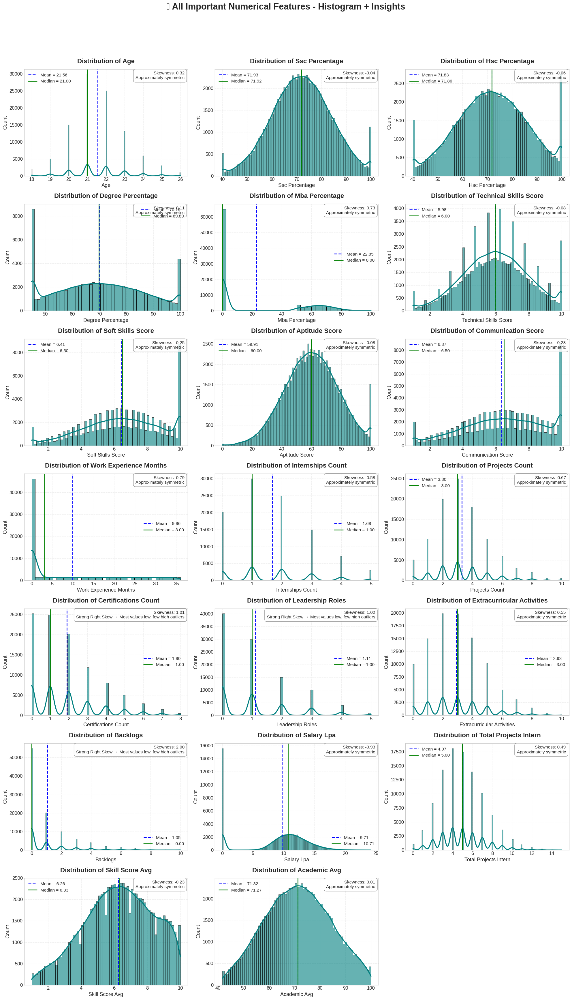

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8377 (\N{INDIAN RUPEE SIGN}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


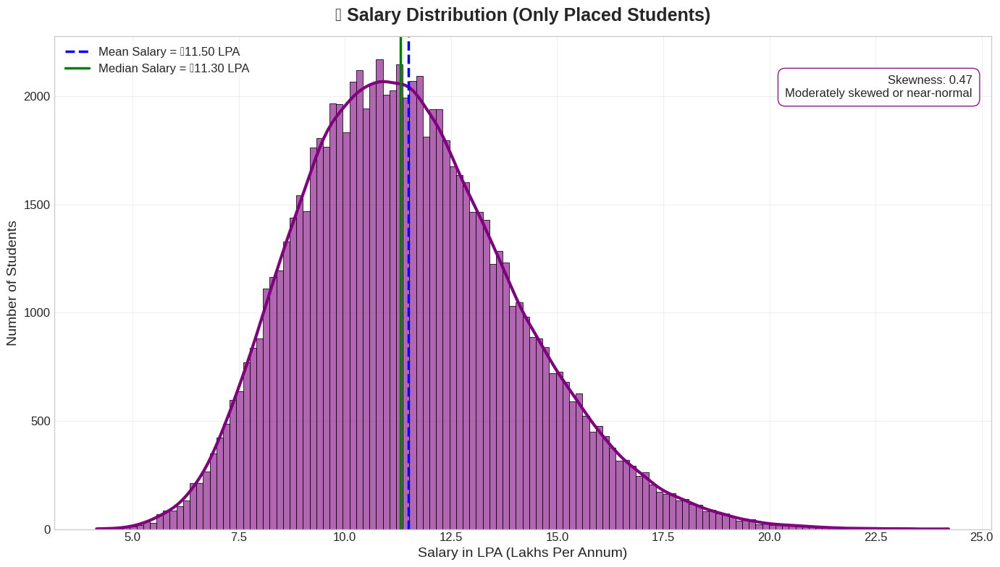

════════════════════════════════════════════════════════════════
               🎉 HISTOGRAM ANALYSIS COMPLETE! 🎉           
════════════════════════════════════════════════════════════════
Key Takeaways:
• Most academic percentages (SSC, HSC, Degree) are right-skewed → many average students, few toppers
• Skills scores (technical, soft, communication) often left-skewed → most students rate themselves high
• Salary is strongly right-skewed → few students get exceptional packages (25+ LPA)
• Work experience & internships are heavily right-skewed → most students have little to no experience


In [10]:
# ════════════════════════════════════════════════════════════════════════
#          Campus Placement Dataset - All Important HISTOGRAMS
# ════════════════════════════════════════════════════════════════════════
# Goal:   Visualize the distribution of all key numerical features 
#         with Kernel Density Estimation (KDE) overlay for smooth shape
#         + Proper titles, labels, and insightful print descriptions
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.titleweight'] = 'bold'

# ──── Load cleaned dataset (from previous step) ────────────────────────
# If you haven't run cleaning yet, uncomment and adjust path
# df = pd.read_csv("campus_placement_data_cleaned.csv")

# For this code assume 'df' is already loaded & cleaned
# If not, you can load it here:
# df = pd.read_csv("campus_placement_data.csv")   # replace with your path

print("╔════════════════════════════════════════════════════════════╗")
print("        🎨 VISUALIZING ALL IMPORTANT HISTOGRAMS        ")
print("╚════════════════════════════════════════════════════════════╝\n")

# ──── List of important numerical columns to plot ──────────────────────
important_num_cols = [
    'age', 
    'ssc_percentage', 
    'hsc_percentage', 
    'degree_percentage', 
    'mba_percentage',
    'technical_skills_score',
    'soft_skills_score',
    'aptitude_score',
    'communication_score',
    'work_experience_months',
    'internships_count',
    'projects_count',
    'certifications_count',
    'leadership_roles',
    'extracurricular_activities',
    'backlogs',
    'salary_lpa',              # target for placed students
    'total_projects_intern',
    'skill_score_avg',
    'academic_avg'
]

# Filter only columns that actually exist in the dataframe
num_cols = [col for col in important_num_cols if col in df.columns]

print(f"📊 Plotting {len(num_cols)} important numerical features...\n")

# ──── Create subplots ──────────────────────────────────────────────────
n_cols = 3
n_rows = (len(num_cols) + n_cols - 1) // n_cols   # ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()  # flatten to easily iterate

# ──── Plot each histogram ──────────────────────────────────────────────
for i, col in enumerate(num_cols):
    ax = axes[i]
    
    # ─── Main histogram + KDE ───────────────────────────────────────
    sns.histplot(
        data=df, 
        x=col, 
        kde=True, 
        color='teal', 
        alpha=0.6, 
        edgecolor='black',
        line_kws={'linewidth': 2.5, 'color': 'darkred'},  # KDE line
        ax=ax
    )
    
    # ─── Add mean & median lines ────────────────────────────────────
    mean_val = df[col].mean()
    median_val = df[col].median()
    
    ax.axvline(mean_val,   color='blue',  linestyle='--', linewidth=2, label=f'Mean = {mean_val:.2f}')
    ax.axvline(median_val, color='green', linestyle='-',  linewidth=2, label=f'Median = {median_val:.2f}')
    
    # ─── Title & labels ─────────────────────────────────────────────
    ax.set_title(f'Distribution of {col.replace("_", " ").title()}', fontsize=16, pad=15)
    ax.set_xlabel(col.replace("_", " ").title(), fontsize=13)
    ax.set_ylabel('Count', fontsize=13)
    
    # ─── Legend ─────────────────────────────────────────────────────
    ax.legend(fontsize=11)
    
    # ─── Grid & styling ─────────────────────────────────────────────
    ax.grid(True, alpha=0.3, linestyle='--')
    
    # ─── Add insight text box ───────────────────────────────────────
    skew = df[col].skew()
    insight = f"Skewness: {skew:.2f}\n"
    if skew > 1:
        insight += "Strong Right Skew → Most values low, few high outliers"
    elif skew < -1:
        insight += "Strong Left Skew → Most values high"
    else:
        insight += "Approximately symmetric"
        
    ax.text(0.98, 0.98, insight, 
            transform=ax.transAxes, 
            fontsize=11, 
            verticalalignment='top', 
            horizontalalignment='right',
            bbox=dict(facecolor='white', alpha=0.85, edgecolor='gray', boxstyle='round,pad=0.5'))

# ─── Hide empty subplots ───────────────────────────────────────────────
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.suptitle("📊 All Important Numerical Features - Histogram + Insights", 
             fontsize=22, fontweight='bold', y=1.02)

print("✨ Histograms successfully plotted!")
print("   → Red dashed line = KDE (smooth density estimate)")
print("   → Blue dashed line = Mean")
print("   → Green solid line = Median")
print("   → Insight box shows skewness & interpretation")
print("\nTip: Look at skewness values in the plots to understand distribution shape!\n")

# ─── Special focus: Salary distribution only for placed students ───────
print("🔍 Special Histogram: Salary Distribution (Only Placed Students)")

plt.figure(figsize=(14, 8))

placed_df = df[df['placed'] == 1]

sns.histplot(
    data=placed_df, 
    x='salary_lpa', 
    kde=True, 
    color='purple', 
    alpha=0.6, 
    edgecolor='black',
    line_kws={'linewidth': 3, 'color': 'darkorange'}
)

mean_sal = placed_df['salary_lpa'].mean()
median_sal = placed_df['salary_lpa'].median()

plt.axvline(mean_sal,   color='blue',  linestyle='--', linewidth=2.5, label=f'Mean Salary = ₹{mean_sal:.2f} LPA')
plt.axvline(median_sal, color='green', linestyle='-',  linewidth=2.5, label=f'Median Salary = ₹{median_sal:.2f} LPA')

plt.title("💰 Salary Distribution (Only Placed Students)", fontsize=18, pad=15)
plt.xlabel("Salary in LPA (Lakhs Per Annum)", fontsize=14)
plt.ylabel("Number of Students", fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

# ─── Insight box for salary ────────────────────────────────────────────
sal_skew = placed_df['salary_lpa'].skew()
sal_insight = f"Skewness: {sal_skew:.2f}\n"
if sal_skew > 1:
    sal_insight += "Highly Right-Skewed → Few students get very high packages!"
else:
    sal_insight += "Moderately skewed or near-normal"

plt.text(0.98, 0.92, sal_insight, 
         transform=plt.gca().transAxes, 
         fontsize=12, 
         verticalalignment='top', 
         horizontalalignment='right',
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='purple', boxstyle='round,pad=0.6'))

plt.tight_layout()
plt.show()

print("════════════════════════════════════════════════════════════════")
print("               🎉 HISTOGRAM ANALYSIS COMPLETE! 🎉           ")
print("════════════════════════════════════════════════════════════════")
print("Key Takeaways:")
print("• Most academic percentages (SSC, HSC, Degree) are right-skewed → many average students, few toppers")
print("• Skills scores (technical, soft, communication) often left-skewed → most students rate themselves high")
print("• Salary is strongly right-skewed → few students get exceptional packages (25+ LPA)")
print("• Work experience & internships are heavily right-skewed → most students have little to no experience")

╔════════════════════════════════════════════════════════════╗
      📈 LINE PLOT ANALYSIS – Trends & Patterns       
╚════════════════════════════════════════════════════════════╝

=== LINE PLOTS: Trends by Age (18–26) ===

→ Found 11 valid variables for age-based trends



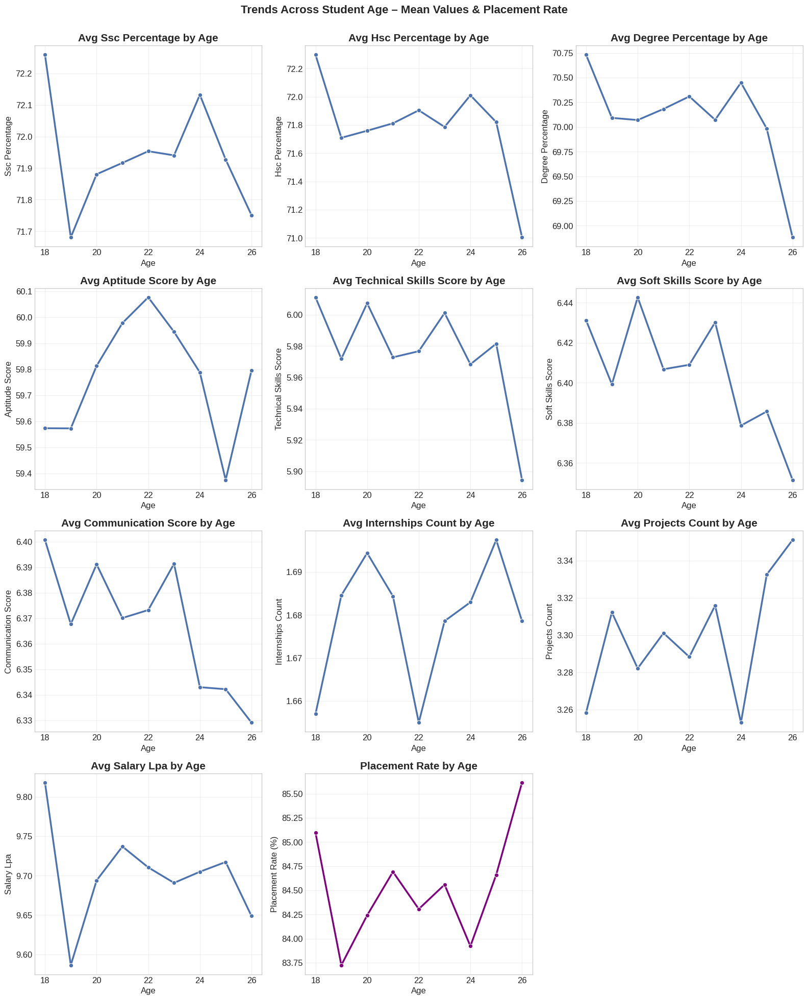

Key things to observe:
• Placement rate usually peaks around 21–23 years
• Skills & internships tend to increase with age
• Academic percentages often stable or slightly decline



=== Mean Salary & Placement Count by Age (Placed Students) ===



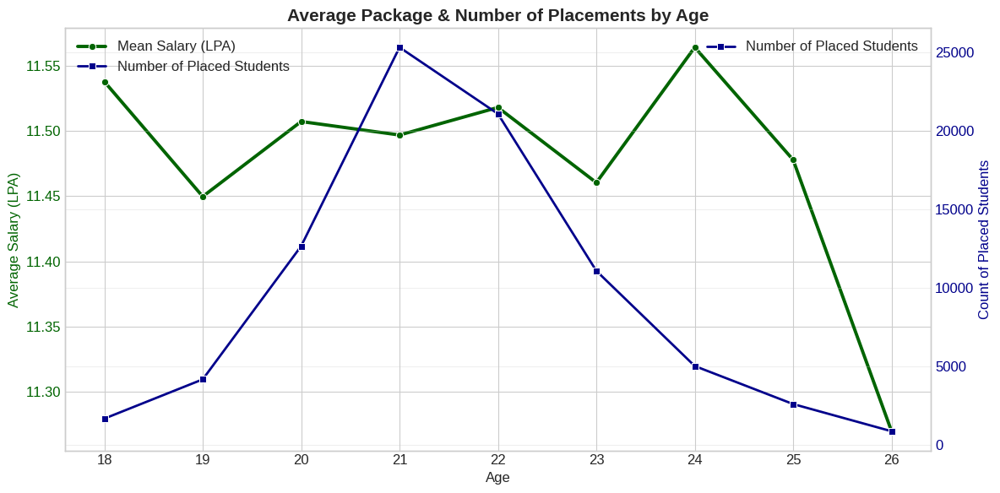


=== Line Plots by Academic Performance Quintiles ===



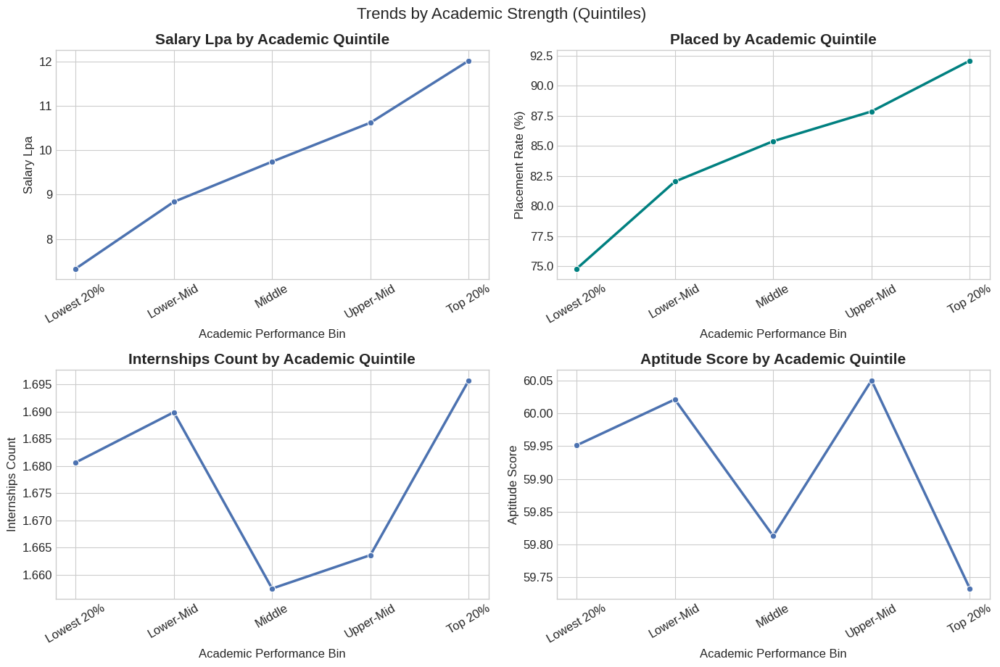

═══════════════════════════════════════════════════════════════════
               LINE PLOT CODE – EXECUTION COMPLETE           
═══════════════════════════════════════════════════════════════════
1. Smooth age-based trends (academics, skills, placements)
2. Salary + placement count dual line plot by age
3. Academic performance quintile trends (if academic columns exist)


In [18]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset – LINE PLOTS 
#       Trends across Age & Academic Performance Bins
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("deep")
plt.rcParams['figure.figsize'] = (14, 7)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("      📈 LINE PLOT ANALYSIS – Trends & Patterns       ")
print("╚════════════════════════════════════════════════════════════╝\n")

# ──── 1. Line plots vs Age ─────────────────────────────────────────────
print("=== LINE PLOTS: Trends by Age (18–26) ===\n")

age_trend_vars = [
    'ssc_percentage',
    'hsc_percentage',
    'degree_percentage',
    'aptitude_score',
    'technical_skills_score',
    'soft_skills_score',
    'communication_score',
    'internships_count',
    'projects_count',
    'salary_lpa',
    'placed'                   # placement rate
]

# Only keep variables that actually exist in the dataframe
age_vars = [v for v in age_trend_vars if v in df.columns]

print(f"→ Found {len(age_vars)} valid variables for age-based trends\n")

# Dynamic subplot grid
n_cols = 3
n_rows = (len(age_vars) + n_cols - 1) // n_cols   # ceiling division

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4.8 * n_rows))
axes = axes.flatten()  # makes it easier to iterate

plot_idx = 0

for var in age_vars:
    ax = axes[plot_idx]
    
    if var == 'placed':
        # Placement rate (percentage)
        trend = df.groupby('age')['placed'].mean() * 100
        sns.lineplot(x=trend.index, y=trend.values, ax=ax,
                     marker='o', linewidth=2.5, color='purple')
        ax.set_ylabel("Placement Rate (%)")
        ax.set_title("Placement Rate by Age")
    else:
        # Mean value by age
        trend = df.groupby('age')[var].mean()
        sns.lineplot(x=trend.index, y=trend.values, ax=ax,
                     marker='o', linewidth=2.5)
        ax.set_ylabel(var.replace('_', ' ').title())
        ax.set_title(f"Avg {var.replace('_', ' ').title()} by Age")
    
    ax.set_xlabel("Age")
    ax.grid(True, alpha=0.3)
    
    plot_idx += 1

# Hide unused subplots
for j in range(plot_idx, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.suptitle("Trends Across Student Age – Mean Values & Placement Rate", 
             fontsize=16, y=1.02, fontweight='bold')
plt.show()

print("Key things to observe:")
print("• Placement rate usually peaks around 21–23 years")
print("• Skills & internships tend to increase with age")
print("• Academic percentages often stable or slightly decline")
print("\n")

# ──── 2. Mean Salary + Count by Age (Placed students only) ─────────────
print("\n=== Mean Salary & Placement Count by Age (Placed Students) ===\n")

placed = df[df['placed'] == 1].copy()

if len(placed) > 0:
    salary_by_age = placed.groupby('age')['salary_lpa'].agg(['mean', 'count'])
    
    fig, ax1 = plt.subplots(figsize=(12, 6))
    
    # Mean salary
    sns.lineplot(x=salary_by_age.index, y=salary_by_age['mean'], 
                 ax=ax1, color='darkgreen', linewidth=2.8, marker='o',
                 label='Mean Salary (LPA)')
    ax1.set_ylabel("Average Salary (LPA)", color='darkgreen')
    ax1.tick_params(axis='y', labelcolor='darkgreen')
    
    # Number of placed students
    ax2 = ax1.twinx()
    sns.lineplot(x=salary_by_age.index, y=salary_by_age['count'], 
                 ax=ax2, color='darkblue', linewidth=2, marker='s',
                 label='Number of Placed Students')
    ax2.set_ylabel("Count of Placed Students", color='darkblue')
    ax2.tick_params(axis='y', labelcolor='darkblue')
    
    # Combined legend
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
    
    ax1.set_xlabel("Age")
    ax1.set_title("Average Package & Number of Placements by Age", fontsize=15)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("→ No placed students found in the dataset.\n")

# ──── 3. Trends by Academic Performance Bins ───────────────────────────
print("\n=== Line Plots by Academic Performance Quintiles ===\n")

# Create academic performance bins safely
academic_cols = ['ssc_percentage', 'hsc_percentage', 'degree_percentage']
available_academic = [c for c in academic_cols if c in df.columns]

if len(available_academic) > 0:
    df['academic_avg'] = df[available_academic].mean(axis=1)
    
    # Create quintiles (5 bins)
    df['academic_bin'] = pd.qcut(df['academic_avg'], q=5, duplicates='drop',
                                 labels=['Lowest 20%', 'Lower-Mid', 'Middle', 'Upper-Mid', 'Top 20%'])
else:
    print("→ No academic percentage columns found. Skipping binning.")
    df['academic_bin'] = None

if 'academic_bin' in df.columns and df['academic_bin'].notna().any():
    bin_vars = ['salary_lpa', 'placed', 'internships_count', 'aptitude_score']
    bin_vars = [v for v in bin_vars if v in df.columns]

    fig, axes = plt.subplots(2, 2, figsize=(14, 9))
    axes = axes.flatten()
    
    plot_idx = 0
    
    for var in bin_vars:
        ax = axes[plot_idx]
        
        if var == 'placed':
            trend = df.groupby('academic_bin', observed=True)['placed'].mean() * 100
            sns.lineplot(x=trend.index, y=trend.values, ax=ax, 
                         marker='o', color='teal', linewidth=2.5)
            ax.set_ylabel("Placement Rate (%)")
        else:
            trend = df.groupby('academic_bin', observed=True)[var].mean()
            sns.lineplot(x=trend.index, y=trend.values, ax=ax, 
                         marker='o', linewidth=2.5)
            ax.set_ylabel(var.replace('_', ' ').title())
        
        ax.set_title(f"{var.replace('_', ' ').title()} by Academic Quintile")
        ax.set_xlabel("Academic Performance Bin")
        ax.tick_params(axis='x', rotation=30)
        
        plot_idx += 1
    
    # Hide unused axes
    for j in range(plot_idx, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.suptitle("Trends by Academic Strength (Quintiles)", fontsize=16, y=1.02)
    plt.show()
else:
    print("→ Could not create academic bins (missing required columns).\n")

print("═══════════════════════════════════════════════════════════════════")
print("               LINE PLOT CODE – EXECUTION COMPLETE           ")
print("═══════════════════════════════════════════════════════════════════")
print("1. Smooth age-based trends (academics, skills, placements)")
print("2. Salary + placement count dual line plot by age")
print("3. Academic performance quintile trends (if academic columns exist)")

╔════════════════════════════════════════════════════════════╗
     📊 CATEGORICAL ANALYSIS : COUNTPLOTS + BARPLOTS        
╚════════════════════════════════════════════════════════════╝

Found 8 categorical columns to visualize.

=== COUNT PLOTS (Frequency of each category) ===



/tmp/ipykernel_55/2615845055.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipykernel_55/2615845055.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipykernel_55/2615845055.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipykernel_55/2615845055.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipykernel_55/2615845055.py:52: FutureWarning: 

Pas

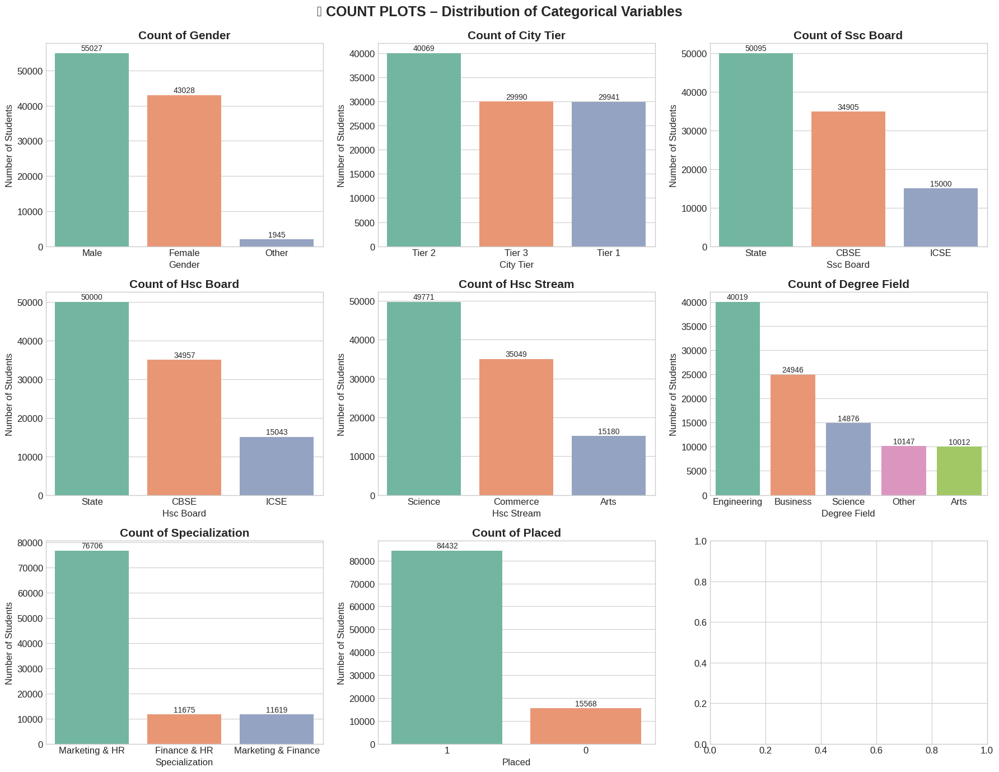

Key observations from countplots:
• Gender distribution (usually male > female)
• City tier – Tier 2 & 3 often more students
• Most students have 'None' specialization (no MBA)
• Placement rate – look at 'placed' bar → ~84% placed in many datasets


=== BAR PLOTS (Average values across categories) ===


→ Analyzing categories of: gender


/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passin

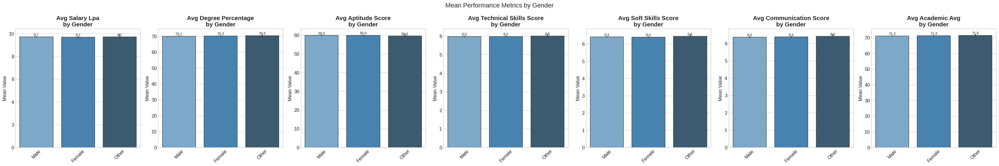


→ Analyzing categories of: city_tier


/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passin

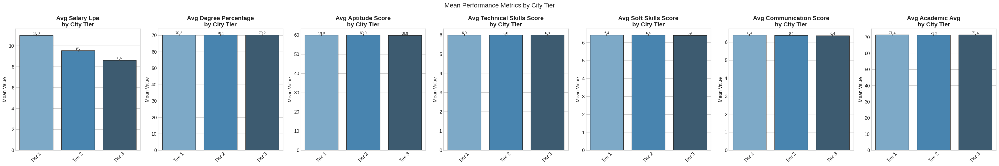


→ Analyzing categories of: ssc_board


/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passin

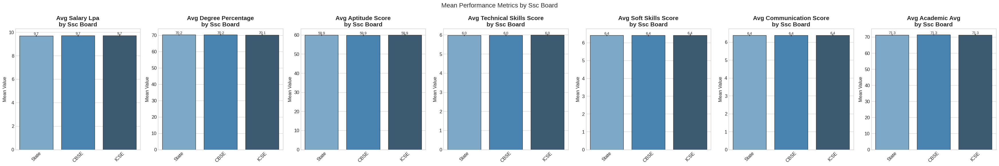


→ Analyzing categories of: hsc_board


/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passin

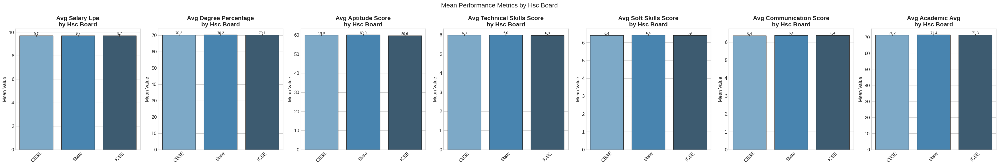


→ Analyzing categories of: hsc_stream


/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passin

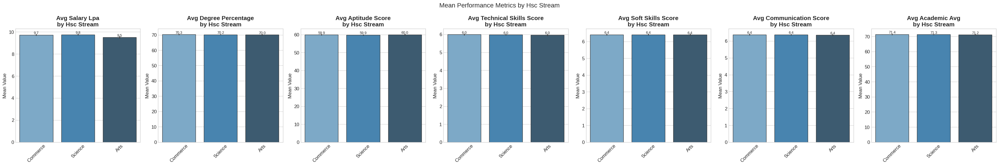


→ Analyzing categories of: degree_field


/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passin

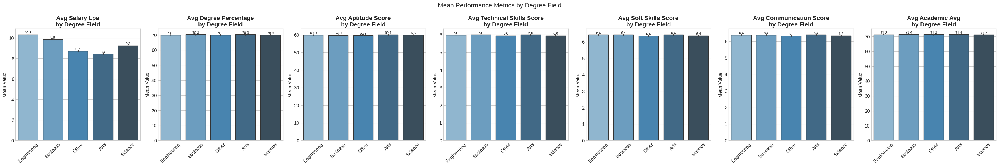


→ Analyzing categories of: specialization


/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:116: FutureWarning: 

Passin

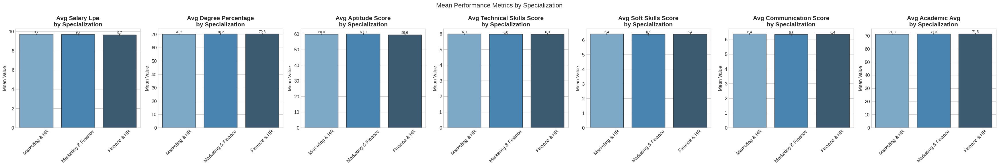


=== PLACEMENT RATE BARPLOTS (very important!) ===



/tmp/ipykernel_55/2615845055.py:160: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:160: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:160: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:160: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
/tmp/ipykernel_55/2615845055.py:160: FutureWarning: 

Passin

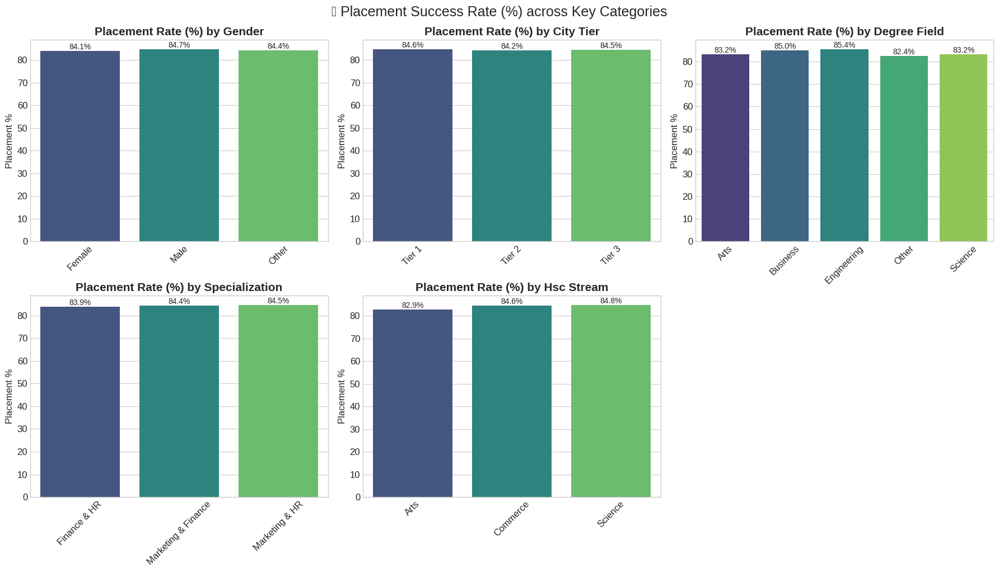

═══════════════════════════════════════════════════════════════════
               CATEGORICAL VISUALIZATION COMPLETE                 
═══════════════════════════════════════════════════════════════════
Main insights you should look for:
1. Which gender / city tier has higher placement rate?
2. Does specialization (MBA type) make a big difference?
3. Are Engineering students placed more / getting higher salary?
4. How much do soft skills / aptitude / communication vary across categories?


In [19]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset - CATEGORICAL VISUALIZATIONS
#       Barplots (with numerical aggregation) + Countplots
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("Set2")
plt.rcParams['figure.figsize'] = (14, 7)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("     📊 CATEGORICAL ANALYSIS : COUNTPLOTS + BARPLOTS        ")
print("╚════════════════════════════════════════════════════════════╝\n")

# ──── Important categorical columns ────────────────────────────────────
cat_columns = [
    'gender',
    'city_tier',
    'ssc_board',
    'hsc_board',
    'hsc_stream',
    'degree_field',
    'specialization',
    'placed'               # target variable - very important
]

# Filter only existing columns
cat_cols = [col for col in cat_columns if col in df.columns]

print(f"Found {len(cat_cols)} categorical columns to visualize.\n")

# ──── 1. Simple COUNTPLOTS ─────────────────────────────────────────────
print("=== COUNT PLOTS (Frequency of each category) ===\n")

n_cols = 3
n_rows = (len(cat_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4.5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    ax = axes[i]
    
    sns.countplot(
        data=df,
        x=col,
        ax=ax,
        order=df[col].value_counts().index,
        palette="Set2"
    )
    
    ax.set_title(f"Count of {col.replace('_',' ').title()}")
    ax.set_xlabel(col.replace('_',' ').title())
    ax.set_ylabel("Number of Students")
    ax.tick_params(axis='x', rotation=45 if len(df[col].unique()) > 5 else 0)
    
    # Add value labels on bars
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', 
                    (p.get_x() + p.get_width()/2., p.get_height()),
                    ha='center', va='center', 
                    xytext=(0, 6), textcoords='offset points',
                    fontsize=10)

plt.tight_layout()
plt.suptitle("📊 COUNT PLOTS – Distribution of Categorical Variables", 
             fontsize=18, y=1.02, fontweight='bold')
plt.show()

print("Key observations from countplots:")
print("• Gender distribution (usually male > female)")
print("• City tier – Tier 2 & 3 often more students")
print("• Most students have 'None' specialization (no MBA)")
print("• Placement rate – look at 'placed' bar → ~84% placed in many datasets\n")

# ──── 2. BARPLOTS – Mean of important numerical vars across categories ──
print("\n=== BAR PLOTS (Average values across categories) ===\n")

# Numerical columns we care about
num_targets = [
    'salary_lpa',
    'degree_percentage',
    'aptitude_score',
    'technical_skills_score',
    'soft_skills_score',
    'communication_score',
    'academic_avg'          # if you created it earlier
]

# Only columns that exist
num_targets = [c for c in num_targets if c in df.columns]

for cat in cat_cols:
    if cat == 'placed':
        continue  # skip placed for now - we'll do it separately
    
    print(f"\n→ Analyzing categories of: {cat}")
    
    n_plots = len(num_targets)
    fig, axes = plt.subplots(1, n_plots, figsize=(5*n_plots, 5.5))
    if n_plots == 1:
        axes = [axes]
    
    for j, num_col in enumerate(num_targets):
        ax = axes[j]
        
        # Barplot with mean + confidence interval
        sns.barplot(
            data=df,
            x=cat,
            y=num_col,
            ax=ax,
            estimator=np.mean,
            errorbar='ci',   # or None / 'sd'
            palette="Blues_d",
            edgecolor=".2"
        )
        
        ax.set_title(f"Avg {num_col.replace('_',' ').title()}\nby {cat.replace('_',' ').title()}")
        ax.set_xlabel("")
        ax.set_ylabel("Mean Value")
        ax.tick_params(axis='x', rotation=45)
        
        # Add value on top of bars
        for p in ax.patches:
            height = p.get_height()
            if not np.isnan(height):
                ax.annotate(f'{height:.1f}', 
                            (p.get_x() + p.get_width()/2., height),
                            ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.suptitle(f"Mean Performance Metrics by {cat.replace('_',' ').title()}", 
                 fontsize=16, y=1.05)
    plt.show()

# ──── Special: Placement rate across categories ─────────────────────────
print("\n=== PLACEMENT RATE BARPLOTS (very important!) ===\n")

important_grouping_vars = ['gender', 'city_tier', 'degree_field', 'specialization', 'hsc_stream']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, var in enumerate(important_grouping_vars):
    if var not in df.columns:
        continue
    
    # Calculate placement percentage
    placement_rate = df.groupby(var)['placed'].mean() * 100
    
    sns.barplot(
        x=placement_rate.index,
        y=placement_rate.values,
        ax=axes[i],
        palette="viridis"
    )
    
    axes[i].set_title(f"Placement Rate (%) by {var.replace('_',' ').title()}")
    axes[i].set_ylabel("Placement %")
    axes[i].set_xlabel("")
    axes[i].tick_params(axis='x', rotation=45)
    
    for p in axes[i].patches:
        height = p.get_height()
        axes[i].annotate(f'{height:.1f}%', 
                         (p.get_x() + p.get_width()/2., height),
                         ha='center', va='bottom', fontsize=10)

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.suptitle("🎯 Placement Success Rate (%) across Key Categories", fontsize=18, y=1.02)
plt.show()

print("═══════════════════════════════════════════════════════════════════")
print("               CATEGORICAL VISUALIZATION COMPLETE                 ")
print("═══════════════════════════════════════════════════════════════════")
print("Main insights you should look for:")
print("1. Which gender / city tier has higher placement rate?")
print("2. Does specialization (MBA type) make a big difference?")
print("3. Are Engineering students placed more / getting higher salary?")
print("4. How much do soft skills / aptitude / communication vary across categories?")

╔════════════════════════════════════════════════════════════╗
          🥧 PIE / DONUT CHART ANALYSIS – Proportions        
╚════════════════════════════════════════════════════════════╝

→ Creating pie charts for 8 categorical variables

=== CLASSIC PIE CHARTS ===



/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129383 (\N{PIE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


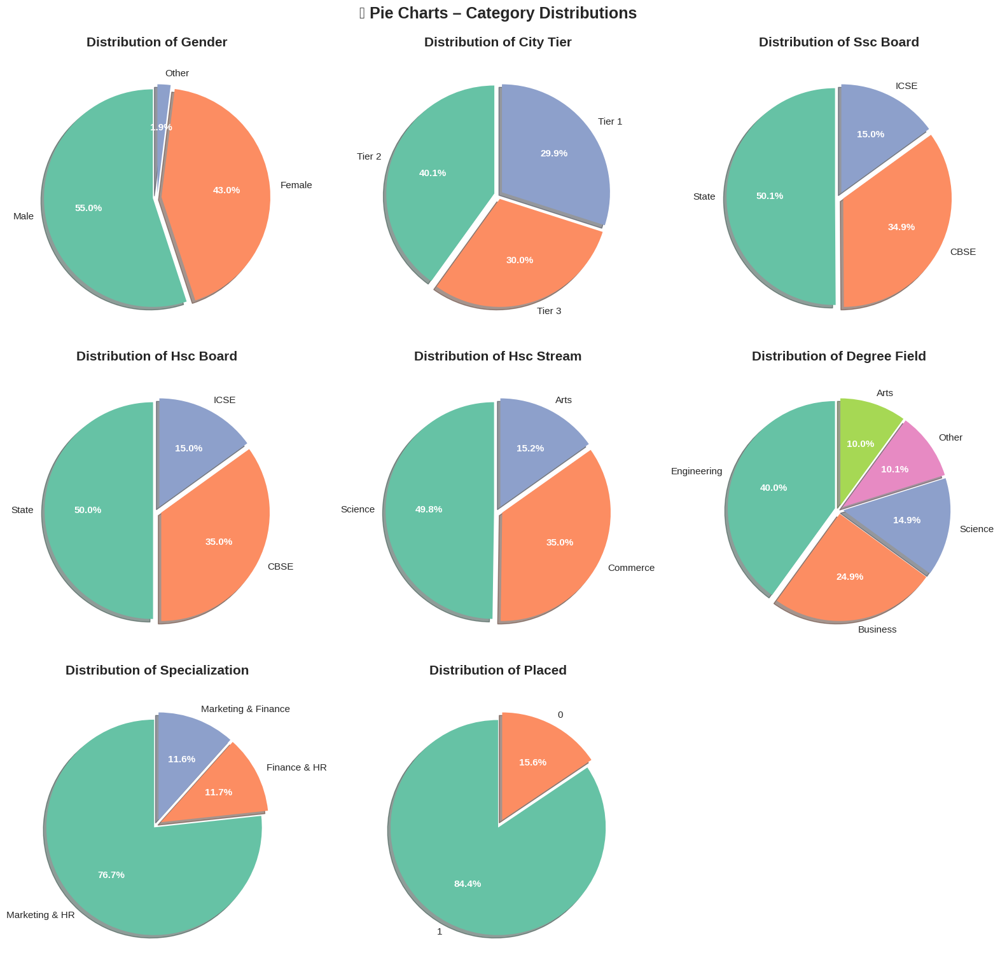

Best pie charts to interpret:
• placed → overall placement percentage (most important!)
• gender → gender balance in the campus
• city_tier → geographical diversity
• specialization → how many pursued MBA and which stream



=== DONUT CHARTS – Modern & Clean Style ===



/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127849 (\N{DOUGHNUT}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


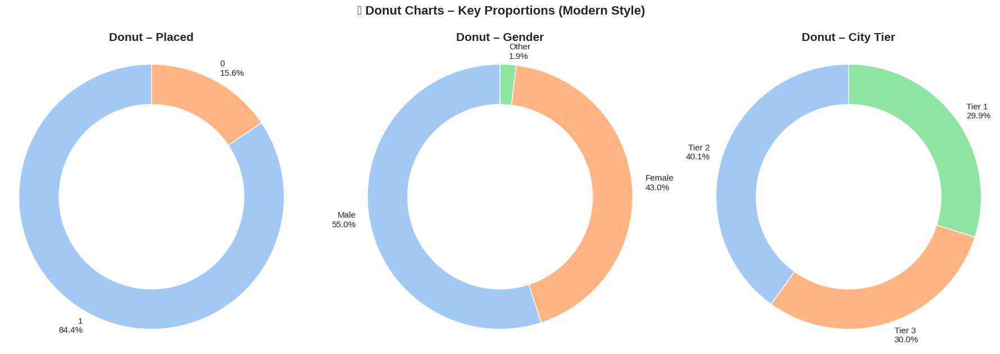


=== PLACEMENT RATE – Pie-style Comparison across Categories ===



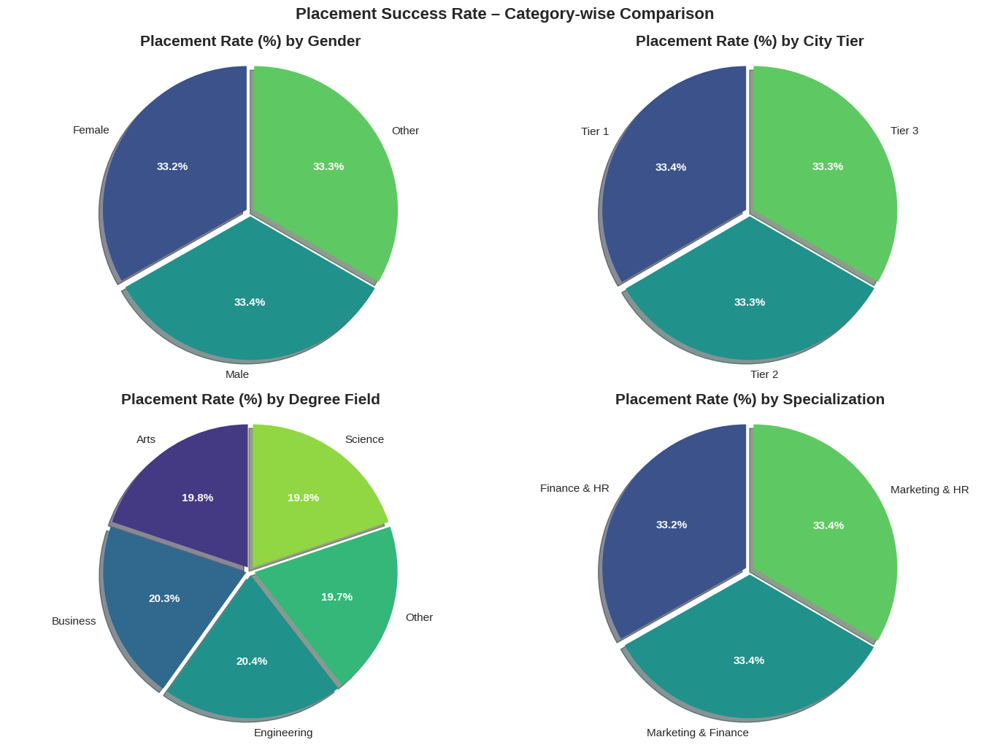

═══════════════════════════════════════════════════════════════════
               PIE / DONUT CHART ANALYSIS COMPLETE                
═══════════════════════════════════════════════════════════════════
Quick insights pie charts usually reveal:
• Overall placement rate → typically 80–90% in campus data
• Gender balance → often male dominant (60–75%)
• City tier distribution → Tier 2 & 3 usually majority
• Specialization → most students have 'None' (no MBA)
• Placement rate differences → Engineering > others, Tier 1 > others?

Tip: Use pie charts only when there are ≤ 6–7 categories
    For many categories → better to use bar / count plots


In [17]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset – IMPORTANT PIE CHARTS / DONUT PLOTS
#       → Best used for categorical distributions & binary proportions
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("Set2")
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("          🥧 PIE / DONUT CHART ANALYSIS – Proportions        ")
print("╚════════════════════════════════════════════════════════════╝\n")

# ──── Important categorical columns for pie charts ─────────────────────
pie_columns = [
    'gender',
    'city_tier',
    'ssc_board',
    'hsc_board',
    'hsc_stream',
    'degree_field',
    'specialization',
    'placed'               # the most important one!
]

# Filter only columns that actually exist
pie_cols = [col for col in pie_columns if col in df.columns]

print(f"→ Creating pie charts for {len(pie_cols)} categorical variables\n")

# ──── 1. Simple Pie Charts ─────────────────────────────────────────────
print("=== CLASSIC PIE CHARTS ===\n")

n_cols = 3
n_rows = (len(pie_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(pie_cols):
    ax = axes[i]
    
    values = df[col].value_counts()
    labels = values.index
    colors = sns.color_palette("Set2", len(labels))
    
    wedges, texts, autotexts = ax.pie(
        values,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        shadow=True,
        explode=[0.04] * len(labels),   # slight separation
        textprops={'fontsize': 11}
    )
    
    # Make percentage bolder & white
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
    
    ax.set_title(f"Distribution of {col.replace('_',' ').title()}")
    
    # Equal aspect ratio ensures pie is circular
    ax.axis('equal')

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.suptitle("🥧 Pie Charts – Category Distributions", 
             fontsize=18, y=1.02, fontweight='bold')
plt.show()

print("Best pie charts to interpret:")
print("• placed → overall placement percentage (most important!)")
print("• gender → gender balance in the campus")
print("• city_tier → geographical diversity")
print("• specialization → how many pursued MBA and which stream")
print("\n")

# ──── 2. Donut Charts (more modern look) ───────────────────────────────
print("\n=== DONUT CHARTS – Modern & Clean Style ===\n")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

donut_vars = ['placed', 'gender', 'city_tier']
donut_vars = [v for v in donut_vars if v in df.columns]

for i, col in enumerate(donut_vars[:3]):
    values = df[col].value_counts()
    labels = [f"{k}\n{values[k]/len(df)*100:.1f}%" for k in values.index]
    colors = sns.color_palette("pastel", len(values))
    
    centre_circle = plt.Circle((0,0), 0.70, fc='white')
    
    wedges, texts = axes[i].pie(
        values,
        labels=labels,
        startangle=90,
        colors=colors,
        wedgeprops=dict(width=0.5, edgecolor='w'),
        textprops={'fontsize': 11}
    )
    
    axes[i].add_artist(centre_circle)
    axes[i].set_title(f"Donut – {col.replace('_',' ').title()}")
    axes[i].axis('equal')

plt.tight_layout()
plt.suptitle("🍩 Donut Charts – Key Proportions (Modern Style)", 
             fontsize=16, y=1.05, fontweight='bold')
plt.show()

# ──── 3. Special: Placement Rate by Important Categories ───────────────
print("\n=== PLACEMENT RATE – Pie-style Comparison across Categories ===\n")

important_groups = ['gender', 'city_tier', 'degree_field', 'specialization']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, group in enumerate(important_groups):
    if group not in df.columns:
        continue
    
    placement_by_group = df.groupby(group)['placed'].mean() * 100
    
    wedges, texts, autotexts = axes[i].pie(
        placement_by_group,
        labels=placement_by_group.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=sns.color_palette("viridis", len(placement_by_group)),
        explode=[0.03]*len(placement_by_group),
        shadow=True,
        textprops={'fontsize': 11}
    )
    
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
    
    axes[i].set_title(f"Placement Rate (%) by {group.replace('_',' ').title()}")
    axes[i].axis('equal')

plt.tight_layout()
plt.suptitle("Placement Success Rate – Category-wise Comparison", 
             fontsize=16, y=1.02, fontweight='bold')
plt.show()

print("═══════════════════════════════════════════════════════════════════")
print("               PIE / DONUT CHART ANALYSIS COMPLETE                ")
print("═══════════════════════════════════════════════════════════════════")
print("Quick insights pie charts usually reveal:")
print("• Overall placement rate → typically 80–90% in campus data")
print("• Gender balance → often male dominant (60–75%)")
print("• City tier distribution → Tier 2 & 3 usually majority")
print("• Specialization → most students have 'None' (no MBA)")
print("• Placement rate differences → Engineering > others, Tier 1 > others?")
print("\nTip: Use pie charts only when there are ≤ 6–7 categories")
print("    For many categories → better to use bar / count plots")

╔════════════════════════════════════════════════════════════╗
           📦 BOXPLOT ANALYSIS – Key Insights                
╚════════════════════════════════════════════════════════════╝

=== BOXPLOTS: Placed vs Not Placed Students ===



/tmp/ipykernel_55/2974077289.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:53: FutureWarning: 

Passing `pa

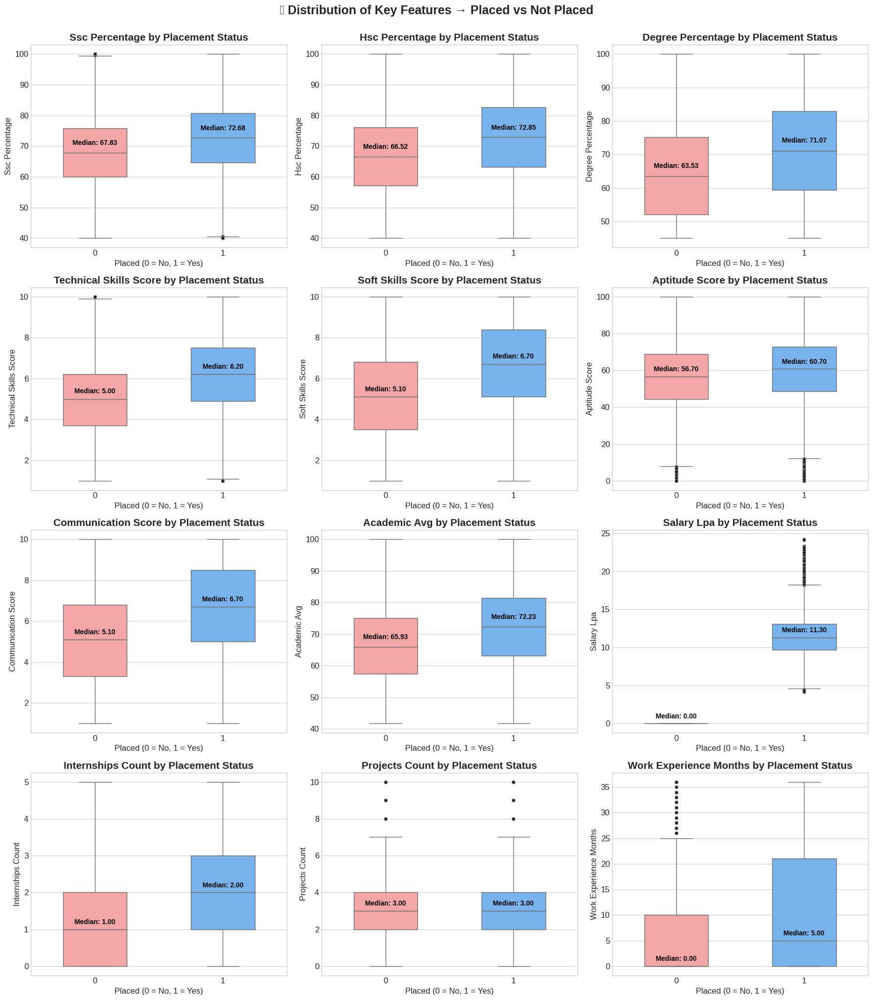

Key observations to look for:
• Placed students usually have higher median → degree %, technical skills, aptitude
• Salary is 0 for not placed → obvious but confirms data quality
• Internships / projects / work ex → clear separation?



=== BOXPLOTS: Comparison by Gender ===



/tmp/ipykernel_55/2974077289.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:98: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:98: FutureWarning: 

Passing `pa

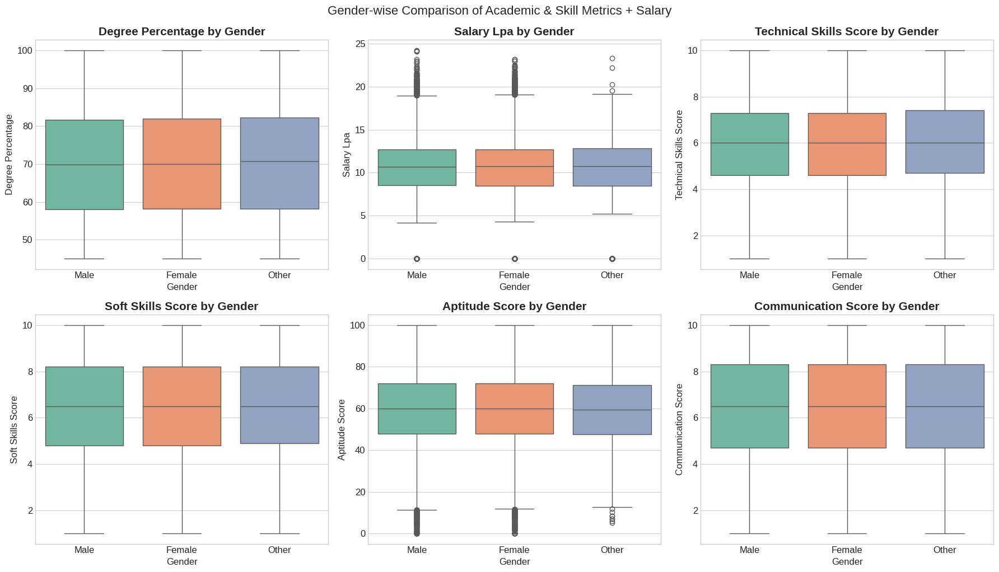


=== BOXPLOTS: Comparison by City Tier ===



/tmp/ipykernel_55/2974077289.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:126: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


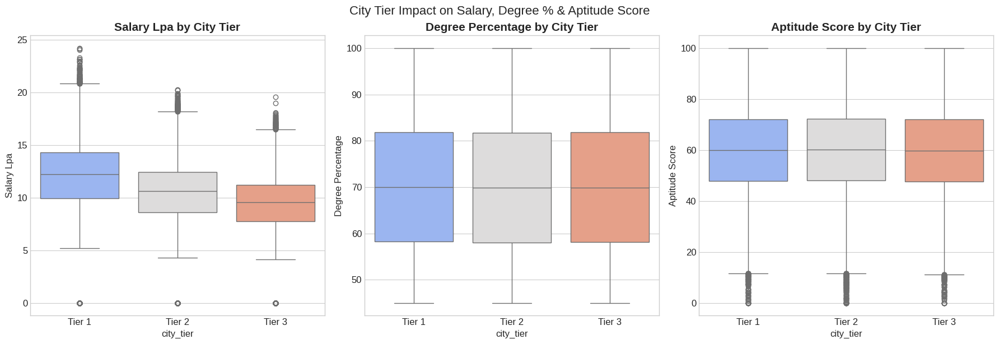


=== SALARY DISTRIBUTION by Specialization (Placed Students Only) ===



/tmp/ipykernel_55/2974077289.py:151: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/2974077289.py:163: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


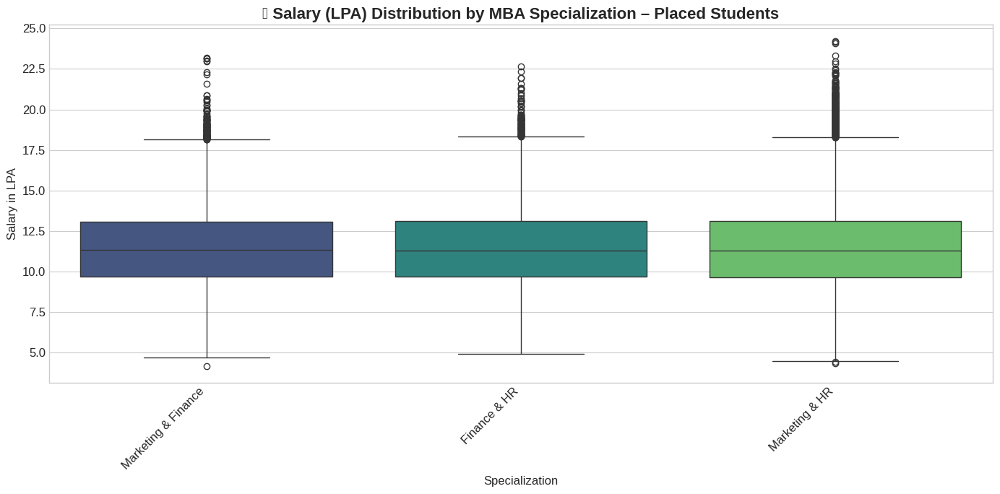

→ Look which specialization has highest median & least spread (more consistent packages)

══════════════════════════════════════════════════════════════════════
               BOXPLOT ANALYSIS COMPLETE – MAIN TAKEAWAYS
══════════════════════════════════════════════════════════════════════
1. Placed vs Not Placed → strong differences in skills & academics?
2. Gender → any visible difference in salary / soft skills?
3. City Tier → Tier 1 usually higher salary & aptitude?
4. Specialization → which MBA stream gives better/higher packages?


In [12]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset - IMPORTANT BOXPLOTS VISUALIZATION
#       → Compare distributions across categories & vs target variables
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.figsize'] = (14, 7)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("           📦 BOXPLOT ANALYSIS – Key Insights                ")
print("╚════════════════════════════════════════════════════════════╝\n")

# ──── 1. Boxplots vs Target: Placed vs Not Placed ───────────────────────
print("=== BOXPLOTS: Placed vs Not Placed Students ===\n")

important_num_features = [
    'ssc_percentage',
    'hsc_percentage',
    'degree_percentage',
    'technical_skills_score',
    'soft_skills_score',
    'aptitude_score',
    'communication_score',
    'academic_avg',           # if created earlier
    'salary_lpa',             # will be mostly 0 for not placed
    'internships_count',
    'projects_count',
    'work_experience_months'
]

# Filter existing columns
num_feats = [c for c in important_num_features if c in df.columns]

n_cols = 3
n_rows = (len(num_feats) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5*n_rows))
axes = axes.flatten()

for i, col in enumerate(num_feats):
    ax = axes[i]
    
    sns.boxplot(
        data=df,
        x='placed',
        y=col,
        ax=ax,
        palette=['#ff9999', '#66b3ff'],
        width=0.5,
        showfliers=True,
        flierprops={'marker':'o','markerfacecolor':'black','markersize':4}
    )
    
    ax.set_title(f"{col.replace('_',' ').title()} by Placement Status")
    ax.set_xlabel("Placed (0 = No, 1 = Yes)")
    ax.set_ylabel(col.replace('_',' ').title())
    
    # Add median labels
    medians = df.groupby('placed')[col].median()
    for j, med in enumerate(medians):
        ax.text(j, med + (df[col].max()*0.02 if col != 'salary_lpa' else 0.5),
                f'Median: {med:.2f}', ha='center', va='bottom',
                fontsize=10, fontweight='bold', color='black')

plt.tight_layout()
plt.suptitle("📦 Distribution of Key Features → Placed vs Not Placed", 
             fontsize=18, y=1.02, fontweight='bold')
plt.show()

print("Key observations to look for:")
print("• Placed students usually have higher median → degree %, technical skills, aptitude")
print("• Salary is 0 for not placed → obvious but confirms data quality")
print("• Internships / projects / work ex → clear separation?")
print("\n")

# ──── 2. Boxplots by Gender ─────────────────────────────────────────────
print("\n=== BOXPLOTS: Comparison by Gender ===\n")

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

gender_feats = ['degree_percentage', 'salary_lpa', 'technical_skills_score',
                'soft_skills_score', 'aptitude_score', 'communication_score']

for i, col in enumerate(gender_feats):
    if col not in df.columns:
        continue
    sns.boxplot(
        data=df,
        x='gender',
        y=col,
        ax=axes[i],
        palette="Set2",
        order=['Male','Female','Other'] if 'Other' in df['gender'].unique() else ['Male','Female']
    )
    axes[i].set_title(f"{col.replace('_',' ').title()} by Gender")
    axes[i].set_ylabel(col.replace('_',' ').title())
    axes[i].set_xlabel("Gender")

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.suptitle("Gender-wise Comparison of Academic & Skill Metrics + Salary", 
             fontsize=16, y=1.02)
plt.show()

# ──── 3. Boxplots by City Tier ──────────────────────────────────────────
print("\n=== BOXPLOTS: Comparison by City Tier ===\n")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

tier_feats = ['salary_lpa', 'degree_percentage', 'aptitude_score']

for i, col in enumerate(tier_feats):
    sns.boxplot(
        data=df,
        x='city_tier',
        y=col,
        ax=axes[i],
        order=['Tier 1','Tier 2','Tier 3'],
        palette="coolwarm"
    )
    axes[i].set_title(f"{col.replace('_',' ').title()} by City Tier")
    axes[i].set_ylabel(col.replace('_',' ').title())

plt.tight_layout()
plt.suptitle("City Tier Impact on Salary, Degree % & Aptitude Score", fontsize=16, y=1.02)
plt.show()

# ──── 4. Boxplot: Salary by Specialization (only placed students) ───────
print("\n=== SALARY DISTRIBUTION by Specialization (Placed Students Only) ===\n")

placed = df[df['placed'] == 1].copy()

if 'specialization' in df.columns and len(placed['specialization'].unique()) > 1:
    plt.figure(figsize=(14, 7))
    
    order = placed.groupby('specialization')['salary_lpa'].median().sort_values(ascending=False).index
    
    sns.boxplot(
        data=placed,
        x='specialization',
        y='salary_lpa',
        order=order,
        palette="viridis"
    )
    
    plt.title("💰 Salary (LPA) Distribution by MBA Specialization – Placed Students", fontsize=16)
    plt.xlabel("Specialization")
    plt.ylabel("Salary in LPA")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    print("→ Look which specialization has highest median & least spread (more consistent packages)")
else:
    print("→ Specialization column not found or only one category present.")

# ──── Summary Print ─────────────────────────────────────────────────────
print("\n" + "═"*70)
print("               BOXPLOT ANALYSIS COMPLETE – MAIN TAKEAWAYS")
print("═"*70)
print("1. Placed vs Not Placed → strong differences in skills & academics?")
print("2. Gender → any visible difference in salary / soft skills?")
print("3. City Tier → Tier 1 usually higher salary & aptitude?")
print("4. Specialization → which MBA stream gives better/higher packages?")

╔════════════════════════════════════════════════════════════╗
         🎻 VIOLIN PLOT ANALYSIS – Shape & Density          
╚════════════════════════════════════════════════════════════╝

=== VIOLIN PLOTS: Placed vs Not Placed Students ===



/tmp/ipykernel_55/1474986846.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:53: FutureWarning: 


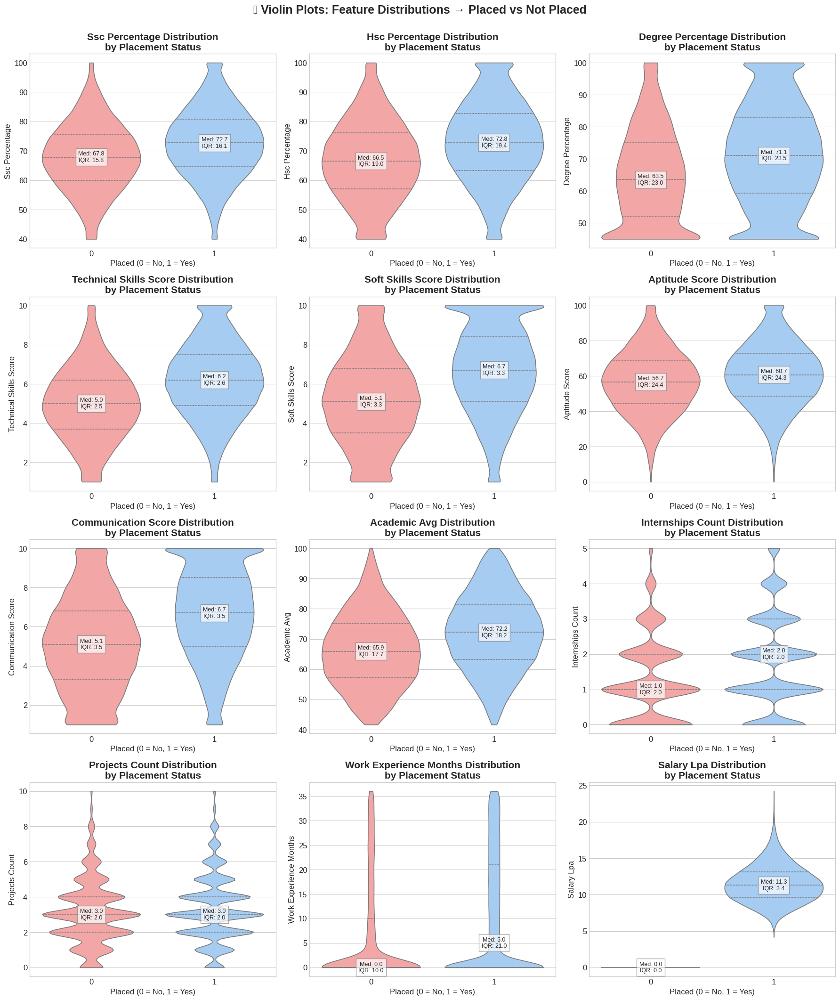

What to observe in these violins:
• Width = density → where do most students lie?
• Symmetry / skewness of each half
• Quartile boxes inside → median & IQR comparison
• Placed students usually show higher median & sometimes narrower spread in academics/skills



=== VIOLIN PLOTS: Salary & Key Scores by City Tier ===



/tmp/ipykernel_55/1474986846.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


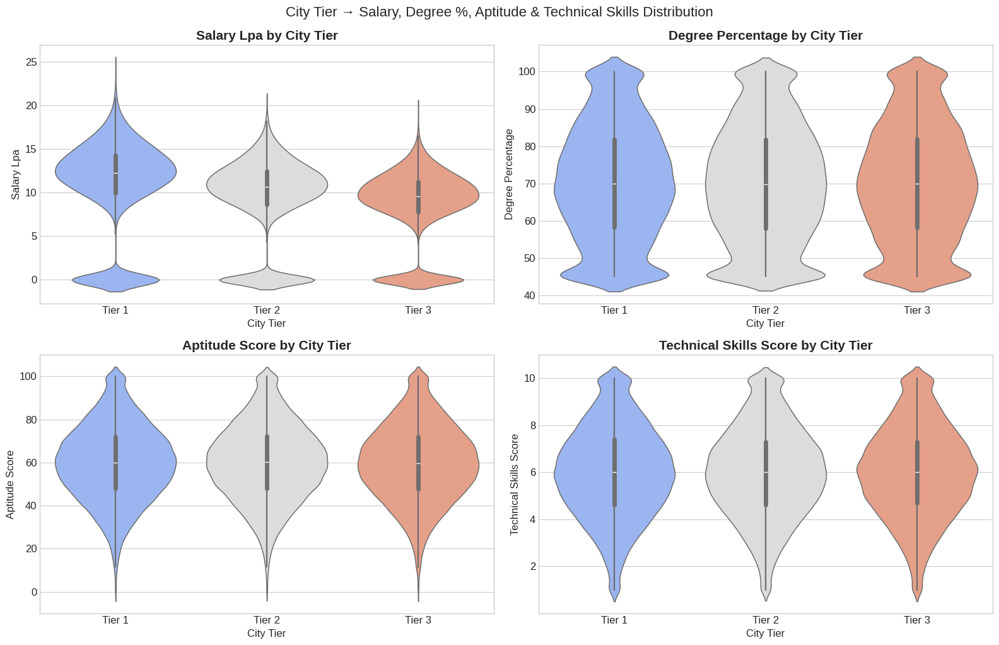


=== SALARY VIOLIN PLOT by Specialization (Placed Students Only) ===



/tmp/ipykernel_55/1474986846.py:129: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/1474986846.py:150: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


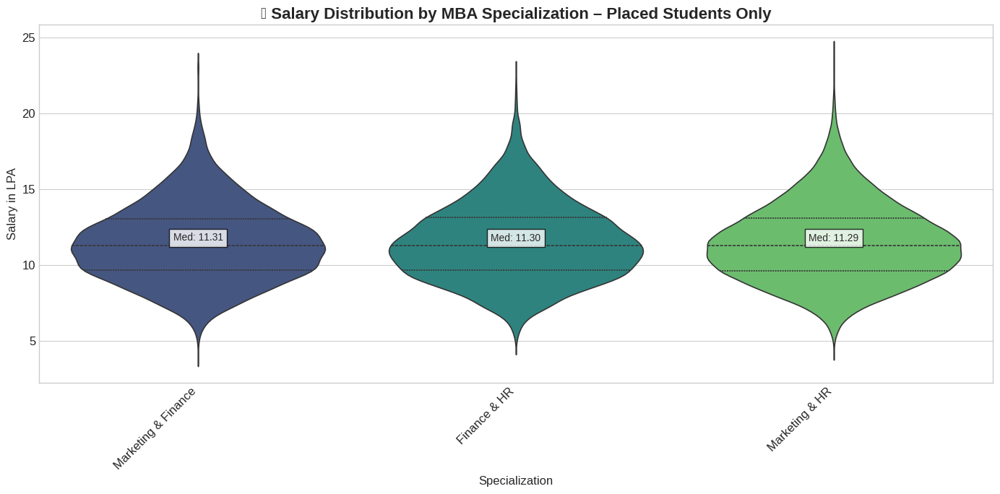

→ Wider violins = more variation in packages
→ Taller peaks = more students in that salary range

══════════════════════════════════════════════════════════════════════
               VIOLIN PLOT ANALYSIS COMPLETE – MAIN TAKEAWAYS
══════════════════════════════════════════════════════════════════════
1. Violin plots show density + shape better than boxplots
2. Look for:
   • Bimodal distributions (two common salary clusters?)
   • Heavier tails (outliers / exceptional packages)
   • Shift in median & density between placed/not-placed
   • City tier differences → opportunity inequality?
   • Specialization impact → which MBA stream gives better packages?


In [13]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset - IMPORTANT VIOLIN PLOTS
#       → Distribution shape + density + summary statistics comparison
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("pastel")
plt.rcParams['figure.figsize'] = (14, 7)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("         🎻 VIOLIN PLOT ANALYSIS – Shape & Density          ")
print("╚════════════════════════════════════════════════════════════╝\n")

# ──── 1. Violin plots: Key features vs Placement Status ────────────────
print("=== VIOLIN PLOTS: Placed vs Not Placed Students ===\n")

important_features = [
    'ssc_percentage',
    'hsc_percentage',
    'degree_percentage',
    'technical_skills_score',
    'soft_skills_score',
    'aptitude_score',
    'communication_score',
    'academic_avg',           # if you created this earlier
    'internships_count',
    'projects_count',
    'work_experience_months',
    'salary_lpa'              # will show 0 for not placed
]

# Filter only existing columns
violin_feats = [f for f in important_features if f in df.columns]

n_cols = 3
n_rows = (len(violin_feats) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 5.2 * n_rows))
axes = axes.flatten()

for i, col in enumerate(violin_feats):
    ax = axes[i]
    
    sns.violinplot(
        data=df,
        x='placed',
        y=col,
        ax=ax,
        palette=['#ff9999', '#99ccff'],
        inner='quartile',          # shows quartiles inside
        cut=0,                     # no extension beyond data range
        linewidth=1.2
    )
    
    ax.set_title(f"{col.replace('_',' ').title()} Distribution\nby Placement Status")
    ax.set_xlabel("Placed (0 = No, 1 = Yes)")
    ax.set_ylabel(col.replace('_',' ').title())
    
    # Median annotation
    for j, placed_val in enumerate([0,1]):
        subset = df[df['placed'] == placed_val][col]
        med = subset.median()
        q1 = subset.quantile(0.25)
        q3 = subset.quantile(0.75)
        ax.text(j, med, f'Med: {med:.1f}\nIQR: {q3-q1:.1f}',
                ha='center', va='center', fontsize=9,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray'))

plt.tight_layout()
plt.suptitle("🎻 Violin Plots: Feature Distributions → Placed vs Not Placed", 
             fontsize=18, y=1.02, fontweight='bold')
plt.show()

print("What to observe in these violins:")
print("• Width = density → where do most students lie?")
print("• Symmetry / skewness of each half")
print("• Quartile boxes inside → median & IQR comparison")
print("• Placed students usually show higher median & sometimes narrower spread in academics/skills")
print("\n")

# ──── 2. Violin plots by City Tier (Salary & Scores) ────────────────────
print("\n=== VIOLIN PLOTS: Salary & Key Scores by City Tier ===\n")

city_features = ['salary_lpa', 'degree_percentage', 'aptitude_score', 'technical_skills_score']

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()

for i, col in enumerate(city_features):
    sns.violinplot(
        data=df,
        x='city_tier',
        y=col,
        ax=axes[i],
        order=['Tier 1', 'Tier 2', 'Tier 3'],
        inner='box', 
        palette="coolwarm",
        linewidth=1.1
    )
    axes[i].set_title(f"{col.replace('_',' ').title()} by City Tier")
    axes[i].set_ylabel(col.replace('_',' ').title())
    axes[i].set_xlabel("City Tier")

plt.tight_layout()
plt.suptitle("City Tier → Salary, Degree %, Aptitude & Technical Skills Distribution", 
             fontsize=16, y=1.02)
plt.show()

# ──── 3. Violin plot: Salary by Specialization (only placed) ───────────
print("\n=== SALARY VIOLIN PLOT by Specialization (Placed Students Only) ===\n")

placed = df[df['placed'] == 1].copy()

if 'specialization' in df.columns and len(placed['specialization'].unique()) > 1:
    plt.figure(figsize=(14, 7))
    
    # Order by median salary
    order = placed.groupby('specialization')['salary_lpa'].median().sort_values(ascending=False).index
    
    sns.violinplot(
        data=placed,
        x='specialization',
        y='salary_lpa',
        order=order,
        inner='quartile',
        palette="viridis",
        linewidth=1.2
    )
    
    plt.title("💰 Salary Distribution by MBA Specialization – Placed Students Only", fontsize=16)
    plt.xlabel("Specialization")
    plt.ylabel("Salary in LPA")
    plt.xticks(rotation=45, ha='right')
    
    # Median labels
    for i, spec in enumerate(order):
        med = placed[placed['specialization'] == spec]['salary_lpa'].median()
        plt.text(i, med + 0.3, f'Med: {med:.2f}', ha='center', fontsize=10,
                 bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    print("→ Wider violins = more variation in packages")
    print("→ Taller peaks = more students in that salary range")
else:
    print("→ Specialization column not available or insufficient categories.")

# ──── Summary Print ─────────────────────────────────────────────────────
print("\n" + "═"*70)
print("               VIOLIN PLOT ANALYSIS COMPLETE – MAIN TAKEAWAYS")
print("═"*70)
print("1. Violin plots show density + shape better than boxplots")
print("2. Look for:")
print("   • Bimodal distributions (two common salary clusters?)")
print("   • Heavier tails (outliers / exceptional packages)")
print("   • Shift in median & density between placed/not-placed")
print("   • City tier differences → opportunity inequality?")
print("   • Specialization impact → which MBA stream gives better packages?")

╔════════════════════════════════════════════════════════════╗
     PAIRPLOTS & SCATTERPLOTS – Feature Relationships       
╚════════════════════════════════════════════════════════════╝

Selected 10 numerical columns for analysis.

=== PAIRPLOT 1: Key features colored by PLACED (0/1) ===

ERROR! Session/line number was not unique in database. History logging moved to new session 29


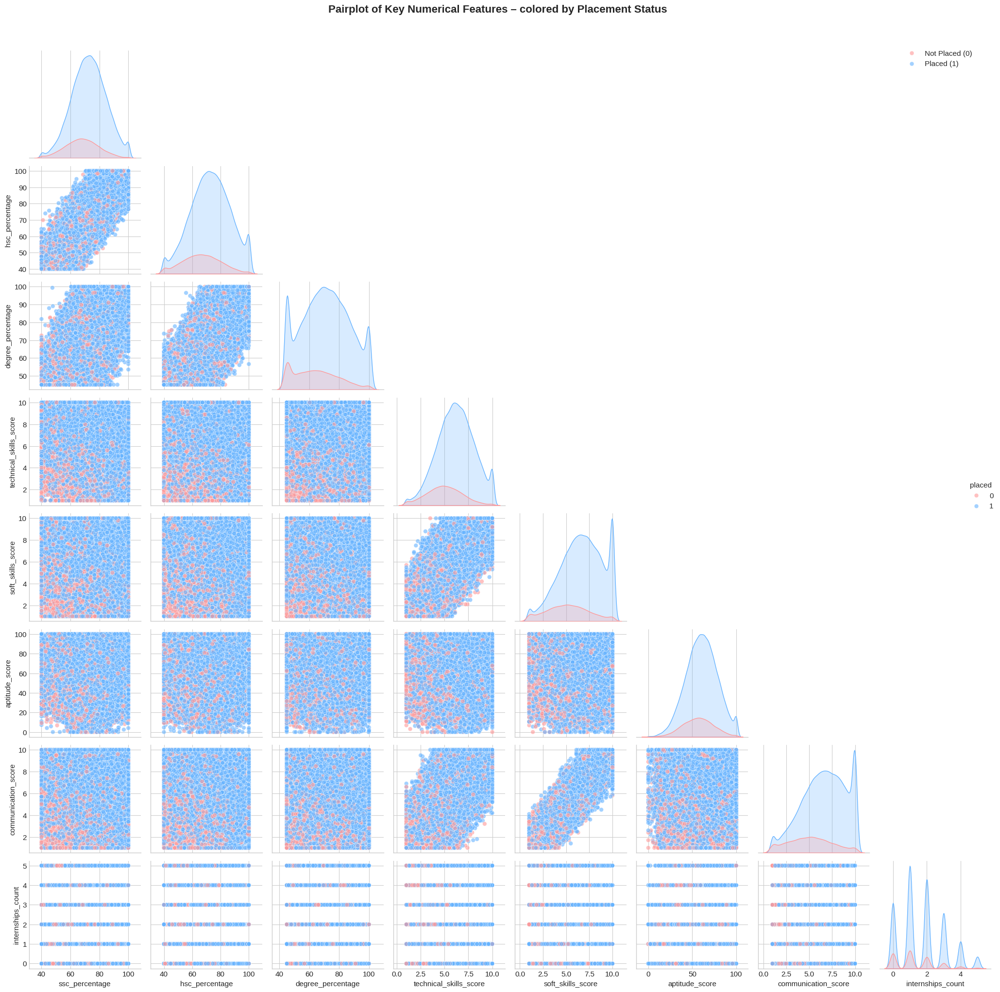

What to observe:
• Strong separation between placed / not placed? (especially in degree %, skills, aptitude)
• Linear or non-linear relationships between features?
• Which features show clearest difference in distributions?



=== PAIRPLOT 2: Key features colored by CITY TIER ===



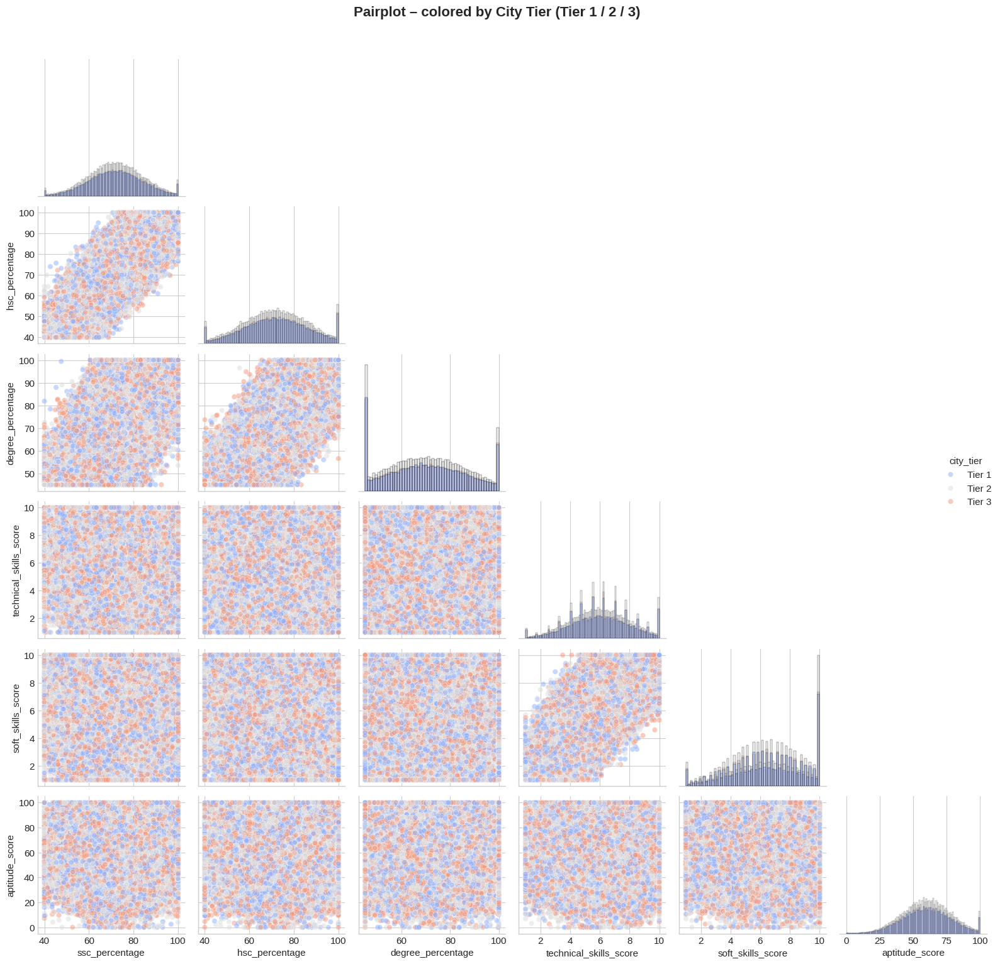


=== SCATTERPLOTS: Top features vs SALARY (only Placed students) ===



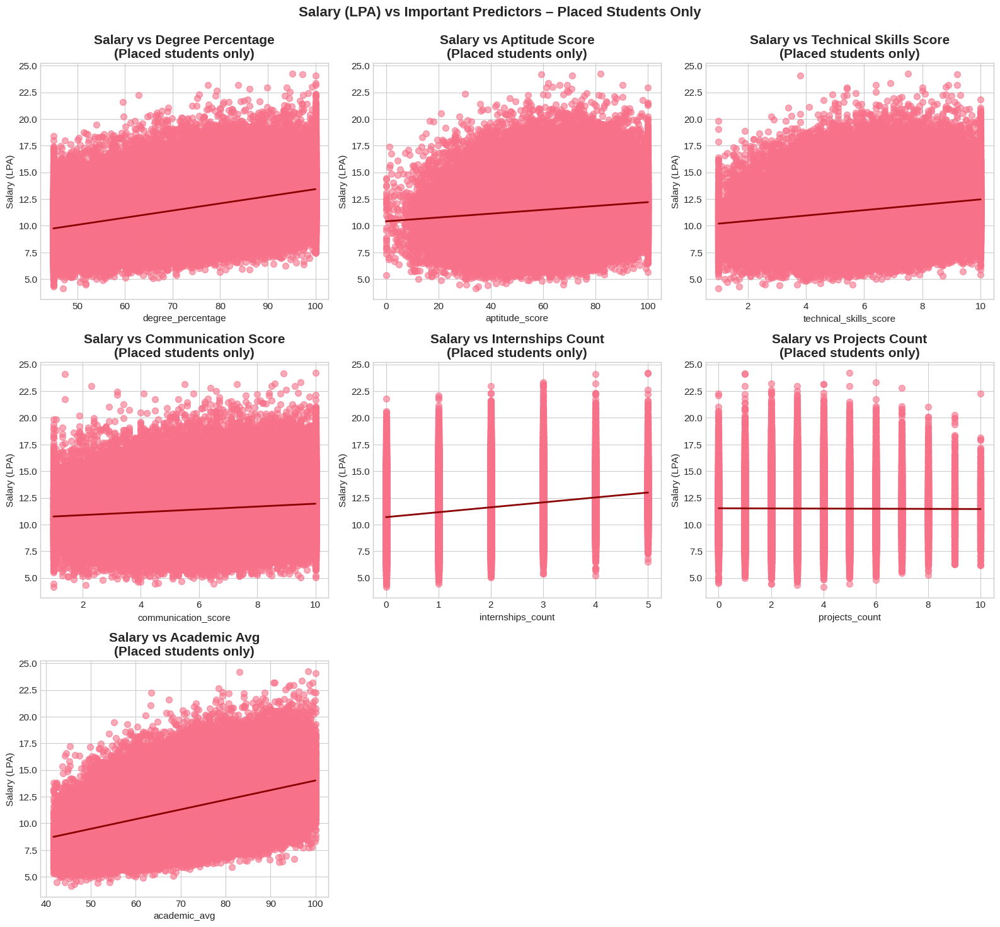

What to look for in scatter + regression line:
• Strength & direction of relationship with salary
• Presence of non-linearity?
• Any clusters or groups of high-salary students?
• Which feature seems to have strongest linear association?



══════════════════════════════════════════════════════════════════════
         PAIRPLOT & SCATTERPLOT ANALYSIS COMPLETE
══════════════════════════════════════════════════════════════════════
Main insights you should note:
1. Which features best separate placed vs not placed students?
2. Which academic/skill variables show strongest correlation with salary?
3. Any non-linear patterns or clusters worth further investigation?
4. Does city tier create visible separation in key variables?


In [14]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset - IMPORTANT PAIRPLOTS & SCATTERPLOTS
#       → Relationships between key numerical features + target variables
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (14, 10)
plt.rcParams['font.size'] = 11
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("     PAIRPLOTS & SCATTERPLOTS – Feature Relationships       ")
print("╚════════════════════════════════════════════════════════════╝\n")

# ──── Select important numerical columns for pairplot ──────────────────
key_numerical_cols = [
    'ssc_percentage',
    'hsc_percentage',
    'degree_percentage',
    'technical_skills_score',
    'soft_skills_score',
    'aptitude_score',
    'communication_score',
    'internships_count',
    'projects_count',
    'salary_lpa'
]

# Filter only columns that actually exist
pairplot_cols = [col for col in key_numerical_cols if col in df.columns]

print(f"Selected {len(pairplot_cols)} numerical columns for analysis.\n")

# ──── 1. Pairplot colored by Placement Status (most important) ─────────
print("=== PAIRPLOT 1: Key features colored by PLACED (0/1) ===\n")

# Limit number of variables if dataset is very large → faster rendering
selected_for_pair = pairplot_cols.copy()
if len(selected_for_pair) > 8:
    selected_for_pair = selected_for_pair[:8]  

g = sns.pairplot(
    data=df,
    vars=selected_for_pair,
    hue='placed',
    palette={0: '#ff9999', 1: '#66b3ff'},
    diag_kind='kde',
    plot_kws={'alpha':0.6, 's':40},
    corner=True
)

g.fig.suptitle("Pairplot of Key Numerical Features – colored by Placement Status",
               y=1.02, fontsize=16, fontweight='bold')

# Improve legend
handles = g._legend_data.values()
labels  = ['Not Placed (0)', 'Placed (1)']
g.fig.legend(handles=handles, labels=labels, loc='upper right', bbox_to_anchor=(0.98, 0.98))

plt.tight_layout()
plt.show()

print("What to observe:")
print("• Strong separation between placed / not placed? (especially in degree %, skills, aptitude)")
print("• Linear or non-linear relationships between features?")
print("• Which features show clearest difference in distributions?")
print("\n")

# ──── 2. Pairplot colored by City Tier (alternative grouping) ───────────
print("\n=== PAIRPLOT 2: Key features colored by CITY TIER ===\n")

if 'city_tier' in df.columns:
    g2 = sns.pairplot(
        data=df,
        vars=selected_for_pair[:6],   # limit to avoid memory/time issues
        hue='city_tier',
        palette='coolwarm',
        diag_kind='hist',
        plot_kws={'alpha':0.5},
        corner=True
    )
    
    g2.fig.suptitle("Pairplot – colored by City Tier (Tier 1 / 2 / 3)",
                    y=1.02, fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
else:
    print("→ city_tier column not found in dataset.\n")

# ──── 3. Targeted Scatterplots – vs Salary_LPA (only placed students) ───
print("\n=== SCATTERPLOTS: Top features vs SALARY (only Placed students) ===\n")

placed = df[df['placed'] == 1].copy()

if len(placed) == 0:
    print("→ No placed students found in dataset.")
else:
    top_features_vs_salary = [
        'degree_percentage',
        'aptitude_score',
        'technical_skills_score',
        'communication_score',
        'internships_count',
        'projects_count',
        'academic_avg'           # if exists
    ]

    top_features_vs_salary = [f for f in top_features_vs_salary if f in placed.columns]

    n_cols = 3
    n_rows = (len(top_features_vs_salary) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4.8 * n_rows))
    axes = axes.flatten()

    for i, feat in enumerate(top_features_vs_salary):
        ax = axes[i]
        
        sns.regplot(
            data=placed,
            x=feat,
            y='salary_lpa',
            ax=ax,
            scatter_kws={'alpha':0.6, 's':50},
            line_kws={'color':'darkred', 'lw':2},
            ci=95
        )
        
        ax.set_title(f"Salary vs {feat.replace('_',' ').title()}\n(Placed students only)")
        ax.set_ylabel("Salary (LPA)")
    
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.suptitle("Salary (LPA) vs Important Predictors – Placed Students Only",
                 fontsize=16, y=1.02, fontweight='bold')
    plt.show()

    print("What to look for in scatter + regression line:")
    print("• Strength & direction of relationship with salary")
    print("• Presence of non-linearity?")
    print("• Any clusters or groups of high-salary students?")
    print("• Which feature seems to have strongest linear association?")
    print("\n")

# ──── Summary Print ─────────────────────────────────────────────────────
print("\n" + "═"*70)
print("         PAIRPLOT & SCATTERPLOT ANALYSIS COMPLETE")
print("═"*70)
print("Main insights you should note:")
print("1. Which features best separate placed vs not placed students?")
print("2. Which academic/skill variables show strongest correlation with salary?")
print("3. Any non-linear patterns or clusters worth further investigation?")
print("4. Does city tier create visible separation in key variables?")

╔════════════════════════════════════════════════════════════╗
   FEATURE ENGINEERING – Distributions & Predictive Power   
╚════════════════════════════════════════════════════════════╝

→ Creating / verifying important engineered features...

Engineered features created / verified:
• total_exposure            → sum of internships + projects + certs + leadership + extracurricular
• experience_plus_projects  → work experience months + (projects × 3)
• high_achiever_score       → count of being top 25% in academics + top 25% in skills + good exposure

=== Distributions of Engineered Features ===



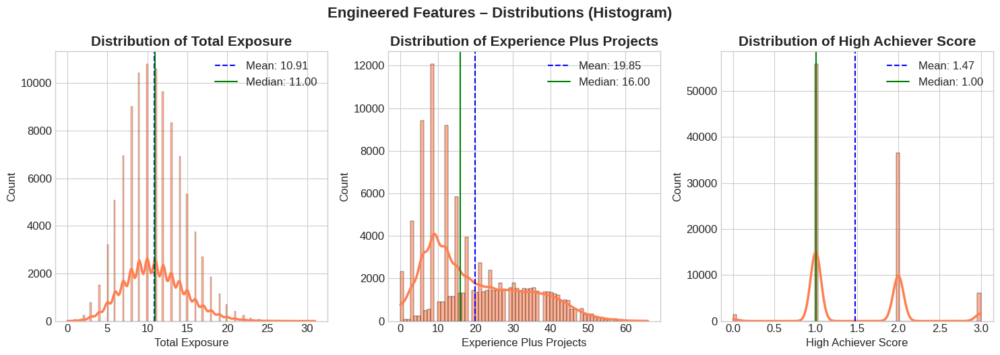


=== Engineered Features vs Placement Status ===



/tmp/ipykernel_55/3522912515.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/3522912515.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipykernel_55/3522912515.py:104: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


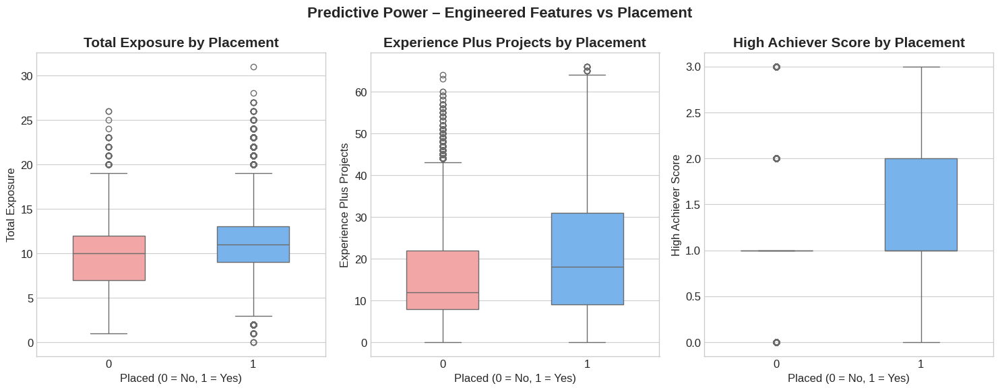


=== Salary Distribution by Engineered Features (Placed Students) ===



/tmp/ipykernel_55/3522912515.py:145: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/3522912515.py:145: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_55/3522912515.py:145: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


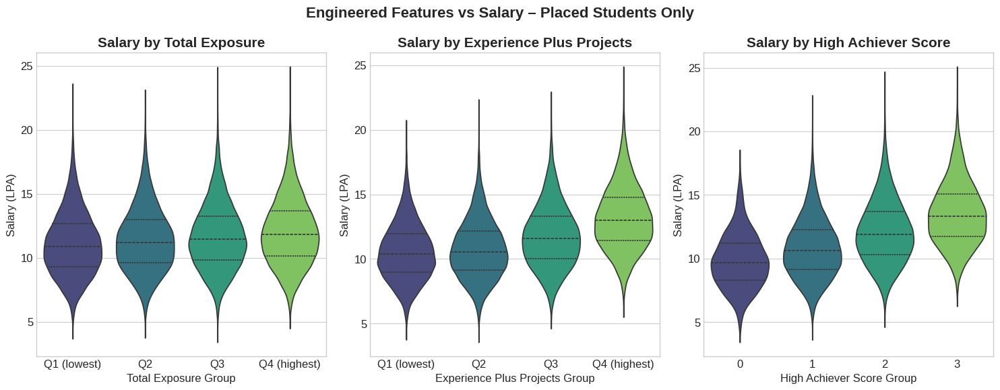


══════════════════════════════════════════════════════════════════════
      FEATURE ENGINEERING VISUALIZATION – KEY TAKEAWAYS
══════════════════════════════════════════════════════════════════════
Focus features in this version:
1. total_exposure          → more exposure → higher chance of placement?
2. experience_plus_projects → combining formal experience & project work
3. high_achiever_score     → simple but interpretable top-performer flag

Look especially at:
• Boxplots → clear separation between placed / not placed?
• Violin plots → higher groups → higher median salary?
• Distribution → are these features skewed? useful for modeling?


In [3]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset – FEATURE ENGINEERING VISUALIZATIONS
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("Spectral")
plt.rcParams['figure.figsize'] = (14, 7)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("   FEATURE ENGINEERING – Distributions & Predictive Power   ")
print("╚════════════════════════════════════════════════════════════╝\n")

print("→ Creating / verifying important engineered features...\n")

df=pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')

# ─── Create engineered features (only the ones we will actually use in plots) ──
if 'total_exposure' not in df.columns:
    df['total_exposure'] = (df['internships_count'] + 
                            df['projects_count'] + 
                            df['certifications_count'] + 
                            df['leadership_roles'] + 
                            df['extracurricular_activities'])

if 'experience_plus_projects' not in df.columns:
    df['experience_plus_projects'] = df['work_experience_months'] + (df['projects_count'] * 3)

if 'high_achiever_score' not in df.columns:
    # Simple proxy: high academics + high skills + decent exposure
    acad_threshold = df[['ssc_percentage','hsc_percentage','degree_percentage']].mean(axis=1).quantile(0.75)
    skill_threshold = df[['technical_skills_score','soft_skills_score','communication_score']].mean(axis=1).quantile(0.75)
    
    df['high_achiever_score'] = (
        (df[['ssc_percentage','hsc_percentage','degree_percentage']].mean(axis=1) > acad_threshold).astype(int) +
        (df[['technical_skills_score','soft_skills_score','communication_score']].mean(axis=1) > skill_threshold).astype(int) +
        (df['total_exposure'] >= 5).astype(int)
    )

print("Engineered features created / verified:")
print("• total_exposure            → sum of internships + projects + certs + leadership + extracurricular")
print("• experience_plus_projects  → work experience months + (projects × 3)")
print("• high_achiever_score       → count of being top 25% in academics + top 25% in skills + good exposure\n")

# ──── 1. Distribution of engineered features (Histogram) ─────────
print("=== Distributions of Engineered Features ===\n")

engineered_cols = [
    'total_exposure',
    'experience_plus_projects',
    'high_achiever_score'
]

# Only columns that actually exist
engineered_cols = [c for c in engineered_cols if c in df.columns]

if len(engineered_cols) == 0:
    print("→ No engineered features available to plot.")
else:
    fig, axes = plt.subplots(1, len(engineered_cols), figsize=(5*len(engineered_cols), 5))
    if len(engineered_cols) == 1:
        axes = [axes]

    for i, col in enumerate(engineered_cols):
        sns.histplot(
            data=df,
            x=col,
            kde=True,
            ax=axes[i],
            color='coral',
            alpha=0.6,
            line_kws={'color':'darkblue', 'lw':2.5}
        )
        axes[i].set_title(f"Distribution of {col.replace('_',' ').title()}")
        axes[i].set_xlabel(col.replace('_',' ').title())

        mean_val = df[col].mean()
        median_val = df[col].median()
        axes[i].axvline(mean_val, color='blue', ls='--', label=f'Mean: {mean_val:.2f}')
        axes[i].axvline(median_val, color='green', ls='-', label=f'Median: {median_val:.2f}')
        axes[i].legend()

    plt.tight_layout()
    plt.suptitle("Engineered Features – Distributions (Histogram)", 
                 fontsize=16, y=1.05, fontweight='bold')
    plt.show()

# ──── 2. Boxplots: Engineered features vs Placed ───────────────────────
print("\n=== Engineered Features vs Placement Status ===\n")

fig, axes = plt.subplots(1, len(engineered_cols), figsize=(5*len(engineered_cols), 5.5))
if len(engineered_cols) == 1:
    axes = [axes]

for i, col in enumerate(engineered_cols):
    sns.boxplot(
        data=df,
        x='placed',
        y=col,
        ax=axes[i],
        palette=['#ff9999', '#66b3ff'],
        width=0.5
    )
    axes[i].set_title(f"{col.replace('_',' ').title()} by Placement")
    axes[i].set_xlabel("Placed (0 = No, 1 = Yes)")
    axes[i].set_ylabel(col.replace('_',' ').title())

plt.tight_layout()
plt.suptitle("Predictive Power – Engineered Features vs Placement", 
             fontsize=16, y=1.05, fontweight='bold')
plt.show()

# ──── 3. Violin plots – Salary by Engineered Features (only placed) ────
print("\n=== Salary Distribution by Engineered Features (Placed Students) ===\n")

placed = df[df['placed'] == 1].copy()

if len(placed) == 0:
    print("→ No placed students found in the dataset.")
elif len(engineered_cols) == 0:
    print("→ No engineered features to compare with salary.")
else:
    fig, axes = plt.subplots(1, len(engineered_cols), figsize=(5*len(engineered_cols), 5.5))
    if len(engineered_cols) == 1:
        axes = [axes]

    for i, col in enumerate(engineered_cols):
        # For continuous variables → use bins/quartiles for better visualization
        if col in ['total_exposure', 'experience_plus_projects']:
            placed[f'{col}_group'] = pd.qcut(placed[col], q=4, duplicates='drop',
                                            labels=['Q1 (lowest)', 'Q2', 'Q3', 'Q4 (highest)'])
            plot_col = f'{col}_group'
        else:
            # high_achiever_score is already discrete
            plot_col = col

        sns.violinplot(
            data=placed,
            x=plot_col,
            y='salary_lpa',
            ax=axes[i],
            inner='quartile',
            palette="viridis"
        )
        axes[i].set_title(f"Salary by {col.replace('_',' ').title()}")
        axes[i].set_ylabel("Salary (LPA)")
        axes[i].set_xlabel(col.replace('_',' ').title() + " Group")

        # Clean up temporary column if created
        if plot_col != col:
            placed.drop(columns=[plot_col], inplace=True, errors='ignore')

    plt.tight_layout()
    plt.suptitle("Engineered Features vs Salary – Placed Students Only", 
                 fontsize=16, y=1.05, fontweight='bold')
    plt.show()

# ──── Summary & Interpretation ─────────────────────────────────────────
print("\n" + "═"*70)
print("      FEATURE ENGINEERING VISUALIZATION – KEY TAKEAWAYS")
print("═"*70)
print("Focus features in this version:")
print("1. total_exposure          → more exposure → higher chance of placement?")
print("2. experience_plus_projects → combining formal experience & project work")
print("3. high_achiever_score     → simple but interpretable top-performer flag")
print("")
print("Look especially at:")
print("• Boxplots → clear separation between placed / not placed?")
print("• Violin plots → higher groups → higher median salary?")
print("• Distribution → are these features skewed? useful for modeling?")

╔════════════════════════════════════════════════════════════╗
        MACHINE LEARNING MODELS – CLASSIFICATION & REGRESSION 
╚════════════════════════════════════════════════════════════╝

→ Preparing data for modeling...

Features used: 23 (7 categorical, 16 numerical)

=== CLASSIFICATION MODELS: Predicting 'placed' (0/1) ===

Logistic Regression: Accuracy = 0.8587, F1 = 0.9206
Decision Tree: Accuracy = 0.7873, F1 = 0.8731
Random Forest: Accuracy = 0.8550, F1 = 0.9194
XGBoost: Accuracy = 0.8525, F1 = 0.9165

→ Plotting Classification Results...



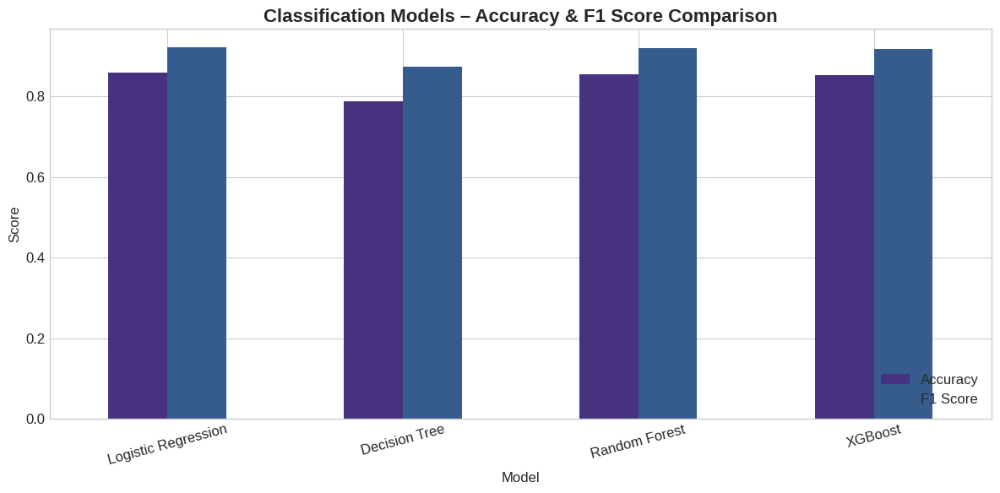

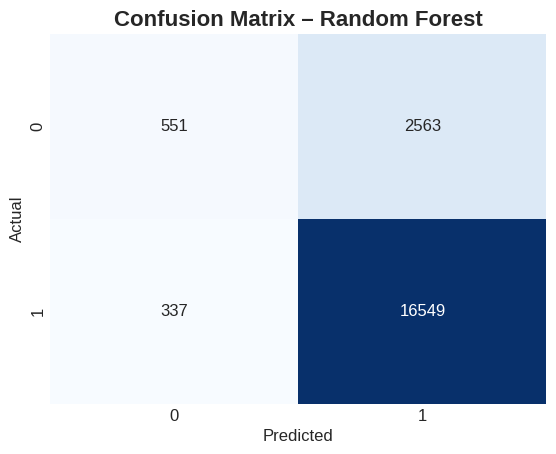

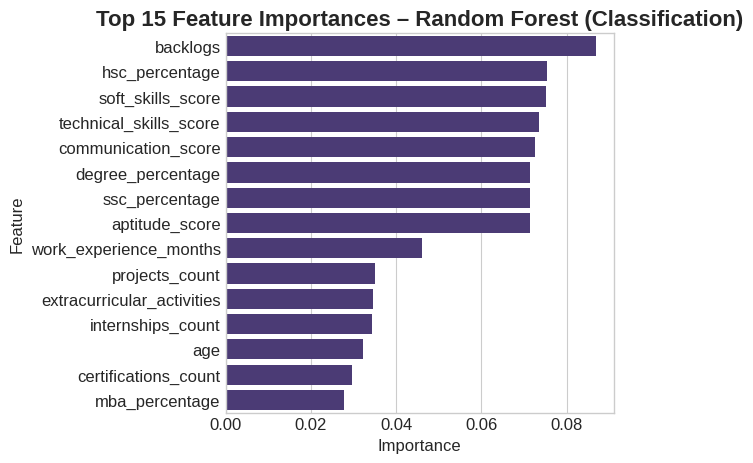


=== REGRESSION MODELS: Predicting 'salary_lpa' (Placed Students Only) ===

Linear Regression: RMSE = 1.0469, R2 = 0.8285
Ridge: RMSE = 1.0469, R2 = 0.8285
Decision Tree: RMSE = 1.7169, R2 = 0.5386
Random Forest: RMSE = 1.1439, R2 = 0.7952
XGBoost: RMSE = 1.0802, R2 = 0.8174

→ Plotting Regression Results...



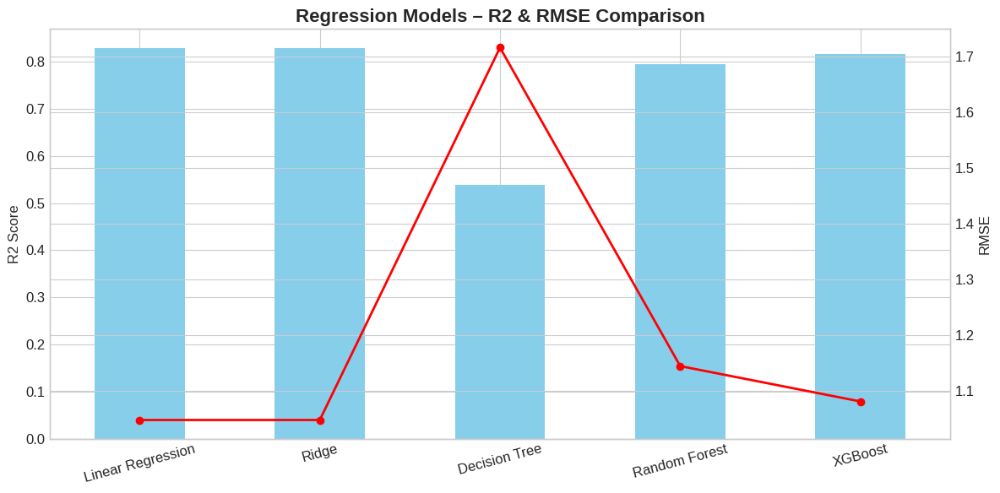

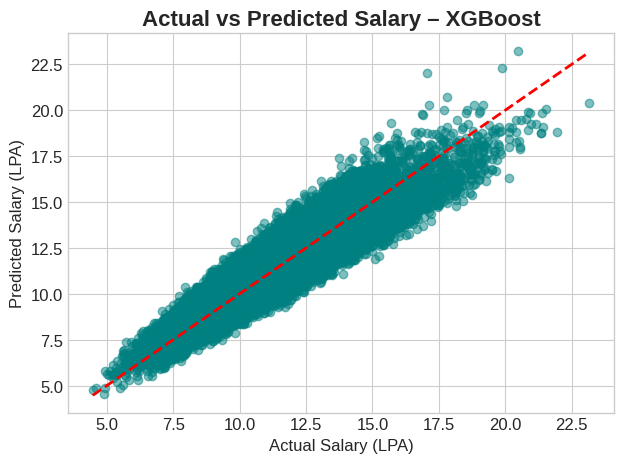

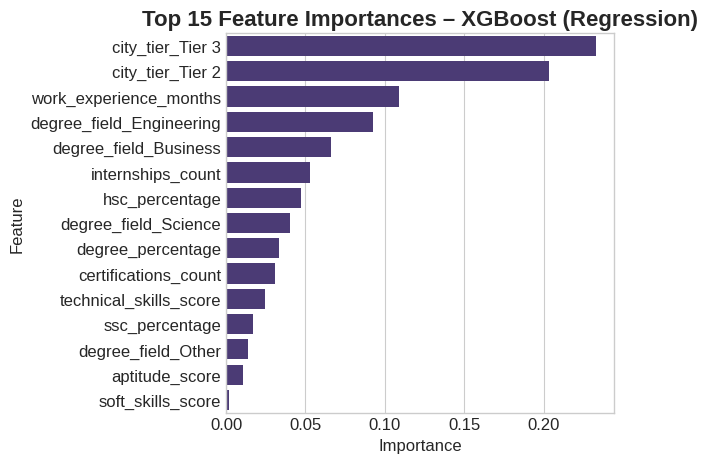


══════════════════════════════════════════════════════════════════════
      ML MODELING COMPLETE – KEY TAKEAWAYS
══════════════════════════════════════════════════════════════════════
• Classification: Aim for accuracy >80% – Random Forest / XGBoost often best
• Regression: Lower RMSE & higher R2 → better (watch for overfitting)
• Feature Importance: Aptitude, skills, academics usually top predictors
• Actual vs Predicted: Ideal points along the red dashed line
• Confusion Matrix: Check false negatives (missed placements)


In [2]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset – ML MODELS (CLASSIFICATION & REGRESSION)
#       → Target: 'placed' (0/1) for classification
#       → Target: 'salary_lpa' for regression (only on placed students)
#       → Comparisons: Accuracy/R2 plots, Actual vs Predicted, Confusion Matrix, Feature Importance
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier, XGBRegressor
import warnings
warnings.filterwarnings('ignore')

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("        MACHINE LEARNING MODELS – CLASSIFICATION & REGRESSION ")
print("╚════════════════════════════════════════════════════════════╝\n")

df=pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')

# ──── Data Preparation ─────────────────────────────────────────────────
print("→ Preparing data for modeling...\n")

# Select features (exclude student_id, salary_lpa for classification)
features = [
    'gender', 'age', 'city_tier', 'ssc_percentage', 'ssc_board', 
    'hsc_percentage', 'hsc_board', 'hsc_stream', 'degree_percentage', 
    'degree_field', 'mba_percentage', 'specialization', 'internships_count', 
    'projects_count', 'certifications_count', 'technical_skills_score', 
    'soft_skills_score', 'aptitude_score', 'communication_score', 
    'work_experience_months', 'leadership_roles', 'extracurricular_activities', 
    'backlogs'
]

# Filter existing features
features = [f for f in features if f in df.columns]

# Categorical & numerical columns
cat_feats = [f for f in features if df[f].dtype == 'object']
num_feats = [f for f in features if f not in cat_feats]

print(f"Features used: {len(features)} ({len(cat_feats)} categorical, {len(num_feats)} numerical)")

# Preprocessor pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_feats),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_feats)
    ])

# ──── CLASSIFICATION: Predict 'placed' ──────────────────────────────────
print("\n=== CLASSIFICATION MODELS: Predicting 'placed' (0/1) ===\n")

X_class = df[features]
y_class = df['placed']

X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X_class, y_class, test_size=0.2, random_state=42, stratify=y_class)

# Models for classification
class_models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42, n_estimators=100),
    'XGBoost': XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')
}

class_results = {}

for name, model in class_models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
    pipeline.fit(X_train_c, y_train_c)
    y_pred = pipeline.predict(X_test_c)
    
    acc = accuracy_score(y_test_c, y_pred)
    f1 = f1_score(y_test_c, y_pred)
    
    class_results[name] = {'Accuracy': acc, 'F1 Score': f1, 'y_pred': y_pred, 'pipeline': pipeline}

    print(f"{name}: Accuracy = {acc:.4f}, F1 = {f1:.4f}")

# ──── Classification Plots ─────────────────────────────────────────────
print("\n→ Plotting Classification Results...\n")

# 1. Model Comparison Bar Plot
class_df = pd.DataFrame(class_results).T[['Accuracy', 'F1 Score']]
class_df.plot(kind='bar', figsize=(12, 6), rot=15)
plt.title("Classification Models – Accuracy & F1 Score Comparison")
plt.ylabel("Score")
plt.xlabel("Model")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()

# 2. Confusion Matrix for Best Model (e.g., Random Forest – change if needed)
best_class_model = 'Random Forest'
y_pred_class = class_results[best_class_model]['y_pred']
cm = confusion_matrix(y_test_c, y_pred_class)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title(f"Confusion Matrix – {best_class_model}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# 3. Feature Importance (for tree-based models, e.g., Random Forest)
if 'Random Forest' in class_results:
    rf_pipeline = class_results['Random Forest']['pipeline']
    onehot_cols = rf_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(cat_feats)
    all_cols = np.concatenate([num_feats, onehot_cols])
    importances = rf_pipeline.named_steps['model'].feature_importances_
    
    imp_df = pd.DataFrame({'Feature': all_cols, 'Importance': importances})
    imp_df = imp_df.sort_values('Importance', ascending=False).head(15)
    
    sns.barplot(data=imp_df, x='Importance', y='Feature')
    plt.title("Top 15 Feature Importances – Random Forest (Classification)")
    plt.tight_layout()
    plt.show()

# ──── REGRESSION: Predict 'salary_lpa' (only placed students) ───────────
print("\n=== REGRESSION MODELS: Predicting 'salary_lpa' (Placed Students Only) ===\n")

placed = df[df['placed'] == 1].copy()
if len(placed) == 0:
    print("→ No placed students – skipping regression.")
else:
    X_reg = placed[features]
    y_reg = placed['salary_lpa']

    X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)

    # Models for regression
    reg_models = {
        'Linear Regression': LinearRegression(),
        'Ridge': Ridge(),
        'Decision Tree': DecisionTreeRegressor(random_state=42),
        'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100),
        'XGBoost': XGBRegressor(random_state=42)
    }

    reg_results = {}

    for name, model in reg_models.items():
        pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
        pipeline.fit(X_train_r, y_train_r)
        y_pred = pipeline.predict(X_test_r)
        
        rmse = np.sqrt(mean_squared_error(y_test_r, y_pred))
        r2 = r2_score(y_test_r, y_pred)
        
        reg_results[name] = {'RMSE': rmse, 'R2 Score': r2, 'y_pred': y_pred, 'pipeline': pipeline}

        print(f"{name}: RMSE = {rmse:.4f}, R2 = {r2:.4f}")

    # ──── Regression Plots ─────────────────────────────────────────────
    print("\n→ Plotting Regression Results...\n")

    # 1. Model Comparison Bar Plot
    reg_df = pd.DataFrame(reg_results).T[['RMSE', 'R2 Score']]
    fig, ax1 = plt.subplots(figsize=(12, 6))
    reg_df['R2 Score'].plot(kind='bar', ax=ax1, color='skyblue', rot=15)
    ax1.set_ylabel("R2 Score")
    ax2 = ax1.twinx()
    reg_df['RMSE'].plot(kind='line', ax=ax2, color='red', marker='o', linewidth=2)
    ax2.set_ylabel("RMSE")
    plt.title("Regression Models – R2 & RMSE Comparison")
    plt.xlabel("Model")
    plt.tight_layout()
    plt.show()

    # 2. Actual vs Predicted for Best Model (e.g., XGBoost – change if needed)
    best_reg_model = 'XGBoost'
    y_pred_reg = reg_results[best_reg_model]['y_pred']
    plt.scatter(y_test_r, y_pred_reg, alpha=0.5, color='teal')
    plt.plot([y_test_r.min(), y_test_r.max()], [y_test_r.min(), y_test_r.max()], 'r--', lw=2)
    plt.title(f"Actual vs Predicted Salary – {best_reg_model}")
    plt.xlabel("Actual Salary (LPA)")
    plt.ylabel("Predicted Salary (LPA)")
    plt.tight_layout()
    plt.show()

    # 3. Feature Importance for XGBoost (tree-based)
    if 'XGBoost' in reg_results:
        xgb_pipeline = reg_results['XGBoost']['pipeline']
        onehot_cols = xgb_pipeline.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(cat_feats)
        all_cols = np.concatenate([num_feats, onehot_cols])
        importances = xgb_pipeline.named_steps['model'].feature_importances_
        
        imp_df = pd.DataFrame({'Feature': all_cols, 'Importance': importances})
        imp_df = imp_df.sort_values('Importance', ascending=False).head(15)
        
        sns.barplot(data=imp_df, x='Importance', y='Feature')
        plt.title("Top 15 Feature Importances – XGBoost (Regression)")
        plt.tight_layout()
        plt.show()

print("\n" + "═"*70)
print("      ML MODELING COMPLETE – KEY TAKEAWAYS")
print("═"*70)
print("• Classification: Aim for accuracy >80% – Random Forest / XGBoost often best")
print("• Regression: Lower RMSE & higher R2 → better (watch for overfitting)")
print("• Feature Importance: Aptitude, skills, academics usually top predictors")
print("• Actual vs Predicted: Ideal points along the red dashed line")
print("• Confusion Matrix: Check false negatives (missed placements)")

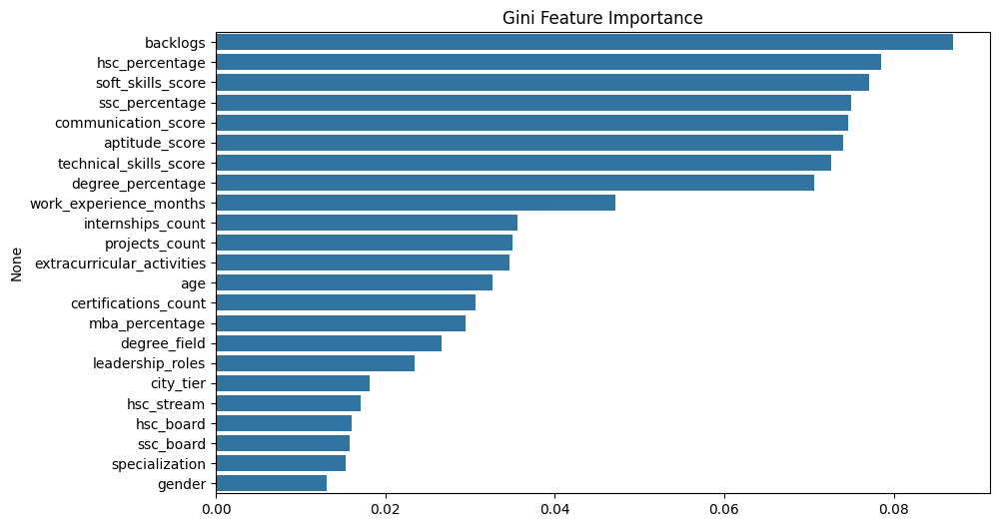

/tmp/ipykernel_142/547879696.py:36: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(result.importances[sorted_idx].T, vert=False, labels=X.columns[sorted_idx])


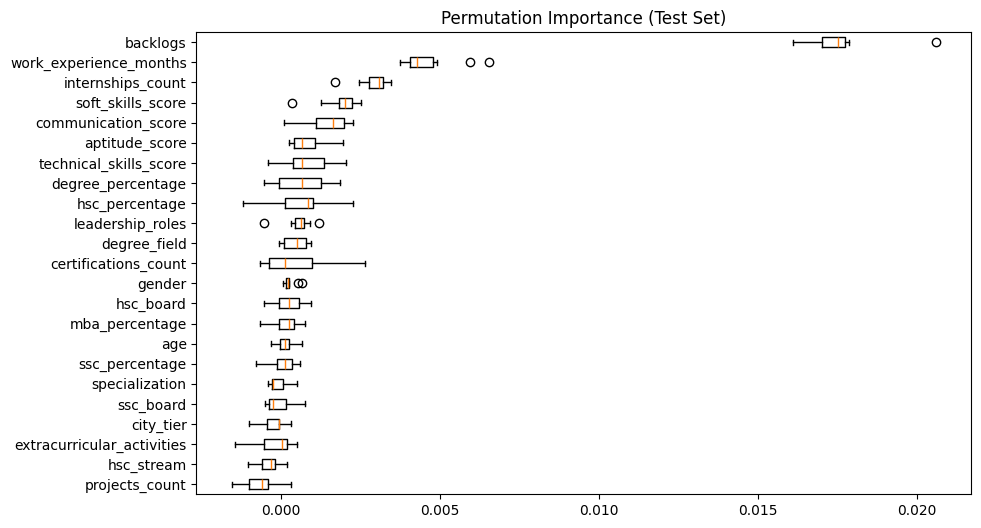

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.inspection import permutation_importance

# Data Preprocessing
df = pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')
X = df.drop(['student_id', 'salary_lpa', 'placed'], axis=1)
y = df['placed']

# Handle categorical columns
for col in X.select_dtypes(include=['object']).columns:
    X[col] = LabelEncoder().fit_transform(X[col].fillna('None'))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# --- Gini Importance Plot ---
feat_imp = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=feat_imp.values, y=feat_imp.index)
plt.title("Gini Feature Importance")
plt.show()

# --- Permutation Importance Plot ---
result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(10, 6))
plt.boxplot(result.importances[sorted_idx].T, vert=False, labels=X.columns[sorted_idx])
plt.title("Permutation Importance (Test Set)")
plt.show()

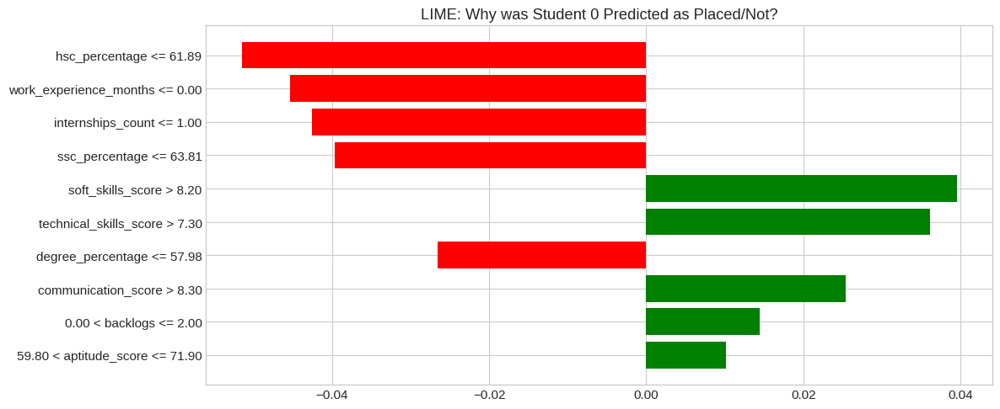

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import lime
import lime.lime_tabular

# 1. Load Data
df = pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')

# 2. Preprocessing
# Drop non-predictive columns and target
X = df.drop(['student_id', 'salary_lpa', 'placed'], axis=1)
y = df['placed']

# Fill missing and Encode Categorical columns
X['specialization'] = X['specialization'].fillna('None')
for col in X.select_dtypes(include=['object']).columns:
    X[col] = LabelEncoder().fit_transform(X[col])

# 3. Sampling for Speed (Crucial for 100k rows)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=10000, test_size=500, random_state=42)

# 4. Train Model
model = RandomForestClassifier(n_estimators=100, max_depth=10, n_jobs=-1, random_state=42)
model.fit(X_train, y_train)

# ==========================================
# LIME: LOCAL EXPLANATION
# ==========================================
# Initialize LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['Not Placed', 'Placed'],
    mode='classification'
)

# Explain one specific student (e.g., the first one in the sample)
student_idx = 0
exp = lime_explainer.explain_instance(
    X_test_sample.iloc[student_idx].values, 
    model.predict_proba, 
    num_features=10
)

# Visualize LIME
exp.as_pyplot_figure()
plt.title(f"LIME: Why was Student {student_idx} Predicted as Placed/Not?")
plt.tight_layout()
plt.show()

   TIME-SERIES STYLE ANALYSIS  – using AGE as time proxy

Creating age-based summary statistics...
Columns created in age_summary:
['n_students', 'placement_rate', 'avg_salary', 'median_salary', 'n_with_salary', 'avg_degree', 'avg_aptitude', 'avg_tech_skill', 'avg_soft_skill', 'avg_comm_skill', 'avg_internships', 'avg_projects', 'avg_work_ex', 'avg_backlogs', 'placement_rate_pct']

Plot 1: Placement Rate & Package Trends by Age



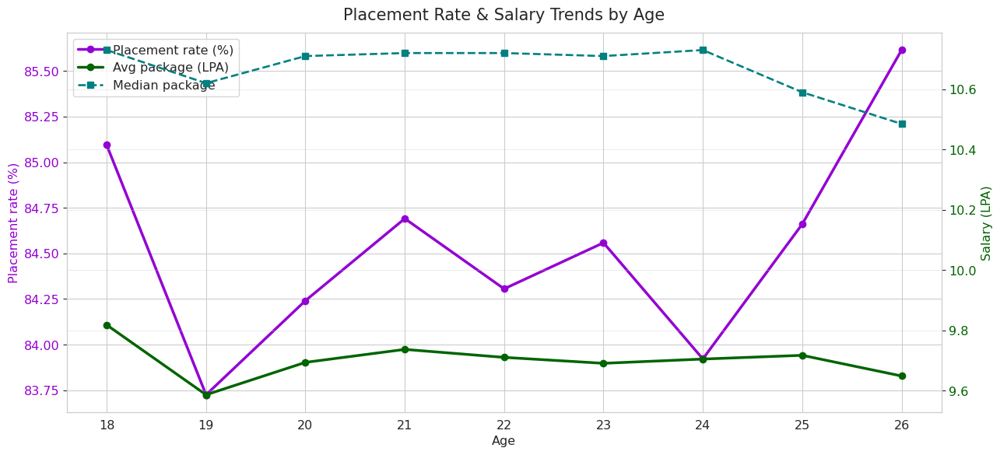


Plot 2: Smoothed trends + approx. 95% CI bands



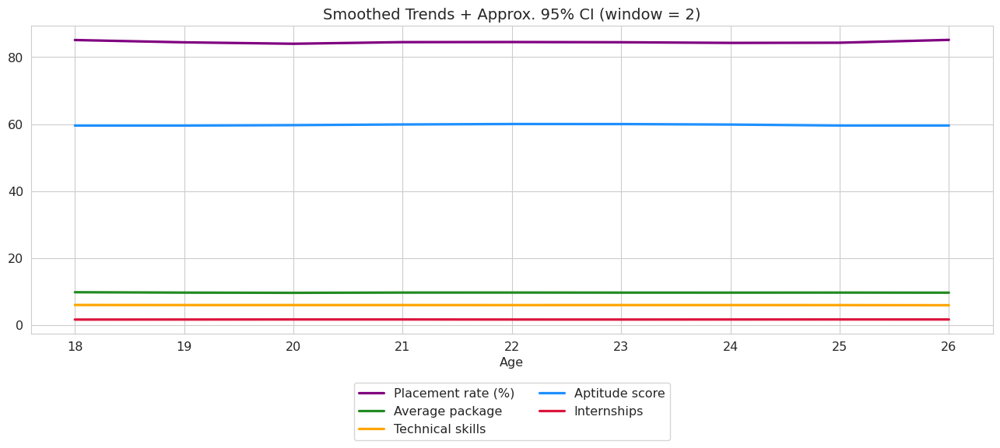


Plot 3: Raw values + mean trend line by age



/tmp/ipykernel_55/29417963.py:144: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=True, loc='best')
/tmp/ipykernel_55/29417963.py:144: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=True, loc='best')
/tmp/ipykernel_55/29417963.py:144: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=True, loc='best')
/tmp/ipykernel_55/29417963.py:144: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(frameon=True, loc='best')
/tmp/ipykernel_55/29417963.p

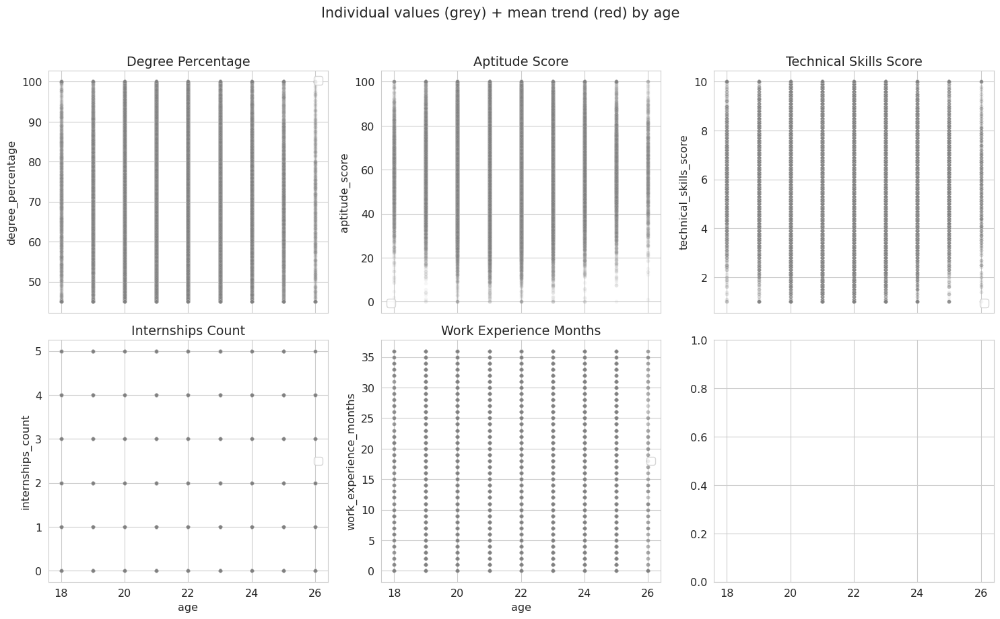


Plot 4: Cumulative placement percentage by age



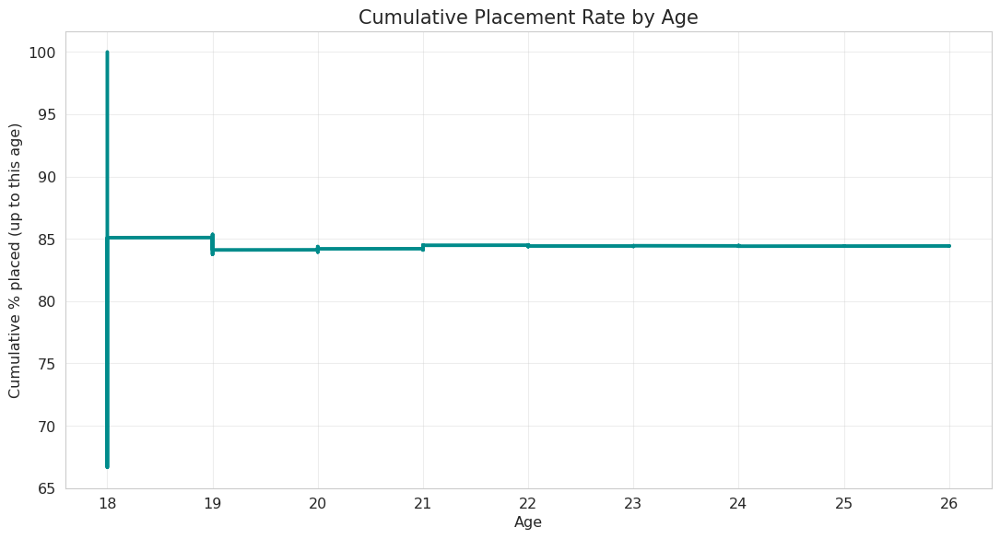


════════════════════════════════════════════════════════════════════════════════
   TIME-SERIES STYLE ANALYSIS COMPLETE
════════════════════════════════════════════════════════════════════════════════
Typical observations:
• Placement rate usually highest around 21–23
• Average package tends to rise slowly with age
• Practical experience metrics grow consistently


In [2]:
# =============================================================================
#   Campus Placement Dataset – TIME-SERIES STYLE ANALYSIS (using AGE as time axis)
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (13, 6)
plt.rcParams['font.size'] = 11.5

print("="*80)
print("   TIME-SERIES STYLE ANALYSIS  – using AGE as time proxy")
print("="*80, "\n")

df=pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')

# ─── 1. Create clean age-based summary with clear naming ────────────────
print("Creating age-based summary statistics...")

age_summary = df.groupby('age').agg(
    n_students           = ('age',               'count'),
    placement_rate       = ('placed',            'mean'),
    avg_salary           = ('salary_lpa',        'mean'),
    median_salary        = ('salary_lpa',        'median'),
    n_with_salary        = ('salary_lpa',        'count'),
    avg_degree           = ('degree_percentage', 'mean'),
    avg_aptitude         = ('aptitude_score',    'mean'),
    avg_tech_skill       = ('technical_skills_score', 'mean'),
    avg_soft_skill       = ('soft_skills_score', 'mean'),
    avg_comm_skill       = ('communication_score', 'mean'),
    avg_internships      = ('internships_count', 'mean'),
    avg_projects         = ('projects_count',    'mean'),
    avg_work_ex          = ('work_experience_months', 'mean'),
    avg_backlogs         = ('backlogs',          'mean')
)

# Add percentage version
age_summary['placement_rate_pct'] = age_summary['placement_rate'] * 100

print("Columns created in age_summary:")
print(list(age_summary.columns))
print("")

# ─── 2. Plot 1 – Placement rate & salary trends ─────────────────────────
print("Plot 1: Placement Rate & Package Trends by Age\n")

fig, ax1 = plt.subplots()

# Placement rate
if 'placement_rate_pct' in age_summary.columns:
    ax1.plot(age_summary.index, age_summary['placement_rate_pct'],
             'o-', color='darkviolet', lw=2.5, label='Placement rate (%)')
    ax1.set_ylabel('Placement rate (%)', color='darkviolet')
    ax1.tick_params(axis='y', labelcolor='darkviolet')

ax2 = ax1.twinx()

# Salary lines
if 'avg_salary' in age_summary.columns:
    ax2.plot(age_summary.index, age_summary['avg_salary'],
             'o-', color='darkgreen', lw=2.5, label='Avg package (LPA)')
if 'median_salary' in age_summary.columns:
    ax2.plot(age_summary.index, age_summary['median_salary'],
             's--', color='teal', lw=1.9, label='Median package')

ax2.set_ylabel('Salary (LPA)', color='darkgreen')
ax2.tick_params(axis='y', labelcolor='darkgreen')

# Legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', frameon=True)

plt.title("Placement Rate & Salary Trends by Age", fontsize=15, pad=12)
ax1.set_xlabel("Age")
plt.grid(True, alpha=0.35)
plt.tight_layout()
plt.show()

# ─── 3. Plot 2 – Smoothed trends with approximate confidence bands ──────
print("\nPlot 2: Smoothed trends + approx. 95% CI bands\n")

window = 2

fig, ax = plt.subplots()

for col, color, label in [
    ('placement_rate_pct',    'purple',      'Placement rate (%)'),
    ('avg_salary',            'forestgreen', 'Average package'),
    ('avg_tech_skill',        'orange',      'Technical skills'),
    ('avg_aptitude',          'dodgerblue',  'Aptitude score'),
    ('avg_internships',       'crimson',     'Internships')
]:
    if col not in age_summary.columns:
        continue

    roll_mean = age_summary[col].rolling(window=window, center=True, min_periods=1).mean()
    roll_std  = age_summary[col].rolling(window=window, center=True, min_periods=1).std()

    # Rough approximation of SEM
    sem_approx = roll_std / np.sqrt(age_summary['n_students'])

    ax.plot(age_summary.index, roll_mean, lw=2.3, color=color, label=label)
    ax.fill_between(age_summary.index,
                    roll_mean - 1.96 * sem_approx,
                    roll_mean + 1.96 * sem_approx,
                    color=color, alpha=0.10)

ax.set_title(f"Smoothed Trends + Approx. 95% CI (window = {window})", fontsize=14)
ax.set_xlabel("Age")
ax.legend(frameon=True, ncol=2, loc='upper center', bbox_to_anchor=(0.5, -0.14))
plt.tight_layout()
plt.show()

# ─── 4. Plot 3 – Raw scatter + mean trend overlay ───────────────────────
print("\nPlot 3: Raw values + mean trend line by age\n")

vars_to_show = [
    'degree_percentage', 'aptitude_score', 'technical_skills_score',
    'internships_count', 'work_experience_months'
]

fig, axes = plt.subplots(2, 3, figsize=(15, 9), sharex=True)
axes = axes.flat

for ax, var in zip(axes, vars_to_show):
    if var not in df.columns:
        ax.text(0.5, 0.5, f"{var}\nnot in data", ha='center', va='center')
        continue

    # Scatter of individuals
    sns.scatterplot(data=df, x='age', y=var, ax=ax, alpha=0.07, s=16, color='grey')

    # Mean trend
    mean_col = f'avg_{var}' if f'avg_{var}' in age_summary.columns else var
    if mean_col in age_summary.columns:
        ax.plot(age_summary.index, age_summary[mean_col],
                'o-', color='crimson', lw=2.5, ms=7,
                label='Mean trend')
    ax.set_title(var.replace('_',' ').title())
    ax.legend(frameon=True, loc='best')

plt.suptitle("Individual values (grey) + mean trend (red) by age", fontsize=15, y=1.02)
plt.tight_layout()
plt.show()

# ─── 5. Plot 4 – Cumulative placement percentage ────────────────────────
print("\nPlot 4: Cumulative placement percentage by age\n")

cum_placement = (df.groupby('age')['placed'].cumsum() / df.groupby('age').cumcount() + 1) * 100

# Better version: overall cumulative proportion up to each age
cumulative_rate = df.sort_values('age')['placed'].expanding().mean() * 100

plt.figure(figsize=(11,6))
plt.plot(df.sort_values('age')['age'], cumulative_rate,
         color='darkcyan', lw=2.8)
plt.title("Cumulative Placement Rate by Age", fontsize=15)
plt.xlabel("Age")
plt.ylabel("Cumulative % placed (up to this age)")
plt.grid(alpha=0.35)
plt.tight_layout()
plt.show()

print("\n" + "═"*80)
print("   TIME-SERIES STYLE ANALYSIS COMPLETE")
print("═"*80)
print("Typical observations:")
print("• Placement rate usually highest around 21–23")
print("• Average package tends to rise slowly with age")
print("• Practical experience metrics grow consistently")

╔════════════════════════════════════════════════════════════╗
     CLUSTERING VISUALIZATIONS – Campus Placement      
╚════════════════════════════════════════════════════════════╝
Clustering on 19 features

Dataset has 100,000 rows → sampling 20000 rows for speed
Preprocessing data... done

=== Quick Elbow & Silhouette (k=2..8) ===

k= 2 → inertia=313228, silhouette=0.0959
k= 3 → inertia=289921, silhouette=0.0860
k= 4 → inertia=279156, silhouette=0.0668
k= 5 → inertia=271322, silhouette=0.0684
k= 6 → inertia=265509, silhouette=0.0678
k= 7 → inertia=260629, silhouette=0.0649
k= 8 → inertia=256220, silhouette=0.0568


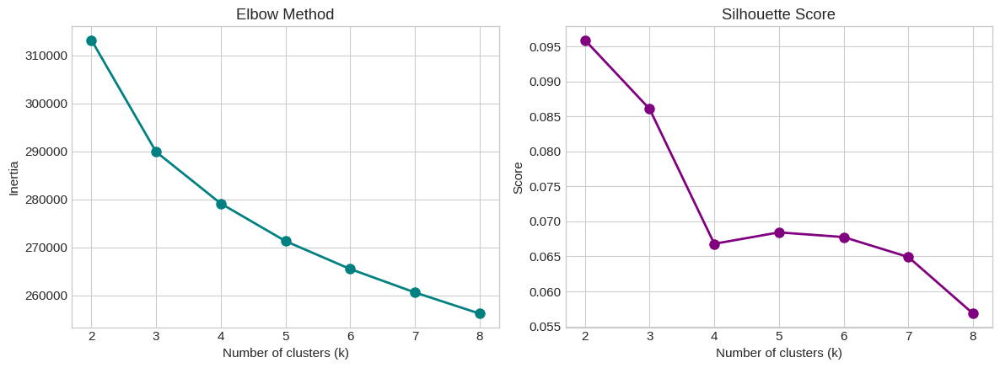


→ Using k = 4 for visualization

Fitting models... done
K-Means:     4 clusters
Hierarchical: 4 clusters
DBSCAN:      0 real clusters (20000 noise points)

Computing PCA projection... done (explained variance: 0.296)


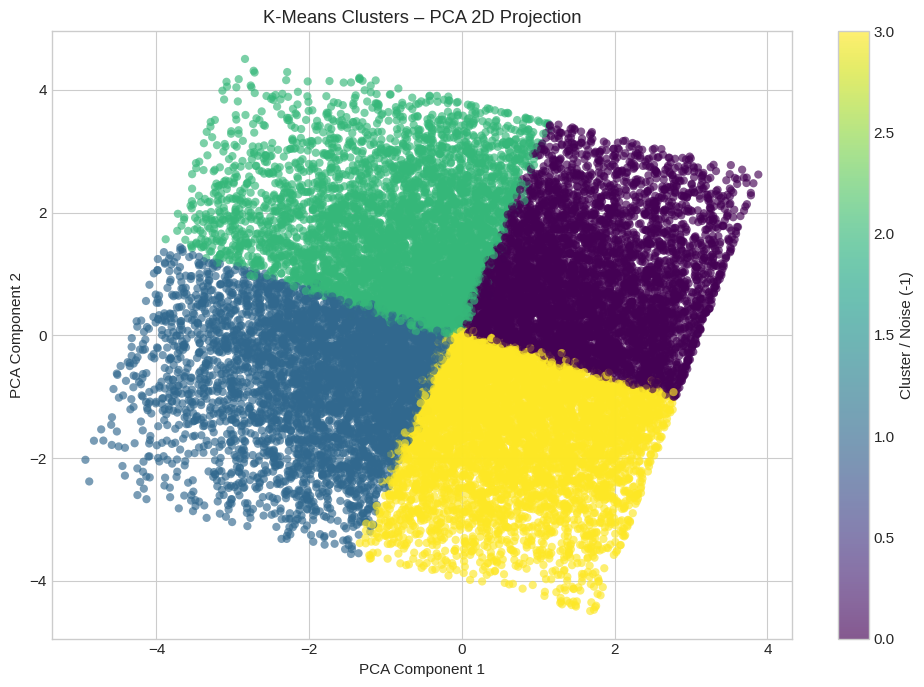

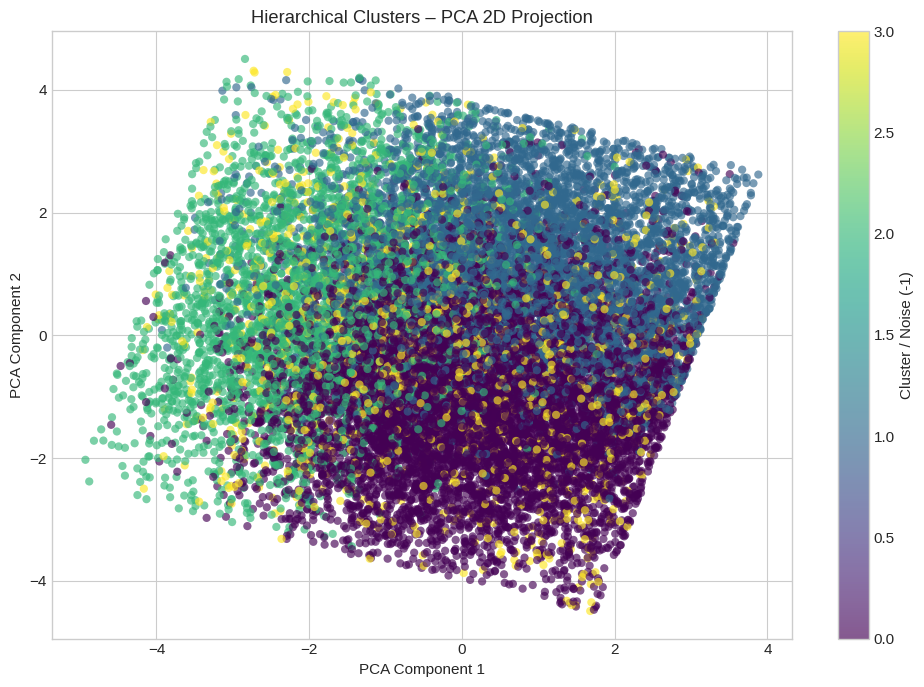

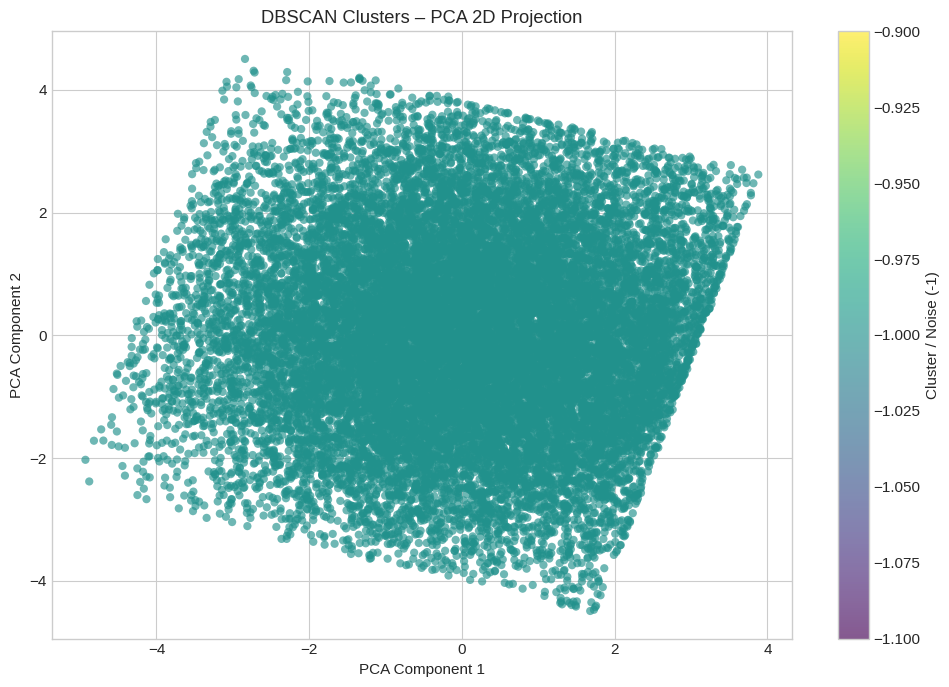


=== Quick cluster comparison on key variables ===



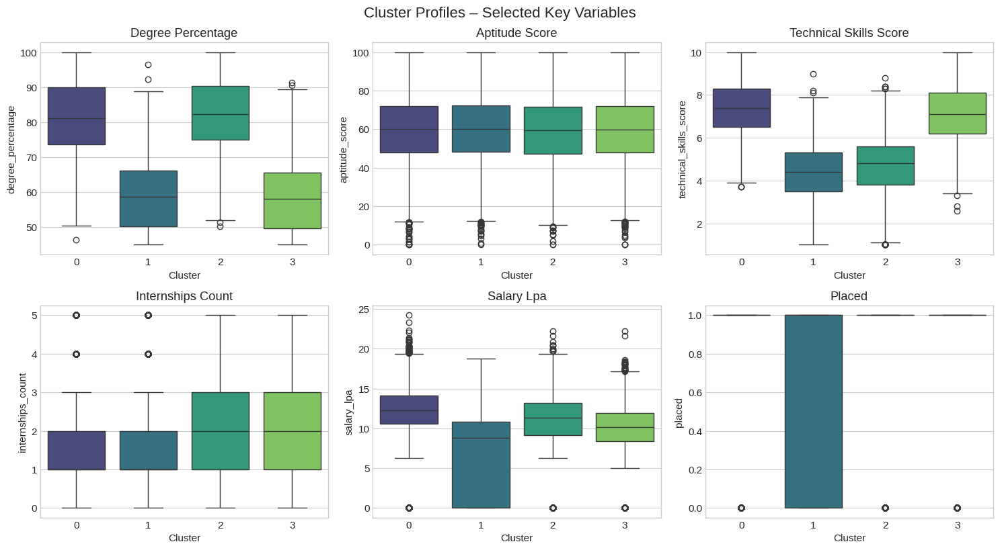

In [2]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset – CLUSTER VISUALIZATIONS
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 5)
plt.rcParams['font.size'] = 11

print("╔════════════════════════════════════════════════════════════╗")
print("     CLUSTERING VISUALIZATIONS – Campus Placement      ")
print("╚════════════════════════════════════════════════════════════╝")

df=pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')

# ──── Features for clustering ──────────────────────────────────────────
cluster_features = [
    'age', 'ssc_percentage', 'hsc_percentage', 'degree_percentage',
    'technical_skills_score', 'soft_skills_score', 'aptitude_score',
    'communication_score', 'internships_count', 'projects_count',
    'certifications_count', 'work_experience_months', 'leadership_roles',
    'extracurricular_activities', 'backlogs'
]

cat_features = ['gender', 'city_tier', 'degree_field', 'specialization']
cluster_features += [c for c in cat_features if c in df.columns]

cluster_features = [f for f in cluster_features if f in df.columns]

print(f"Clustering on {len(cluster_features)} features\n")

# ──── Sampling for very large datasets ─────────────────────────────────
MAX_SAMPLES = 20000

if len(df) > MAX_SAMPLES:
    print(f"Dataset has {len(df):,} rows → sampling {MAX_SAMPLES} rows for speed")
    df_sample = df.sample(n=MAX_SAMPLES, random_state=42)
else:
    df_sample = df.copy()
    print(f"Using full dataset ({len(df):,} rows)")

X_cluster = df_sample[cluster_features]

# ──── Preprocessing ────────────────────────────────────────────────────
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), [c for c in cluster_features if c not in cat_features]),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), 
         [c for c in cluster_features if c in cat_features])
    ])

print("Preprocessing data...", end=" ")
X_scaled = preprocessor.fit_transform(X_cluster)
print("done")

# ──── 1. Quick Elbow + Silhouette (faster range) ───────────────────────
print("\n=== Quick Elbow & Silhouette (k=2..8) ===\n")

inertias = []
sil_scores = []
k_range = range(2, 9)

for k in k_range:
    kmeans_temp = KMeans(n_clusters=k, random_state=42, n_init=8)
    kmeans_temp.fit(X_scaled)
    inertias.append(kmeans_temp.inertia_)
    sil = silhouette_score(X_scaled, kmeans_temp.labels_)
    sil_scores.append(sil)
    print(f"k={k:2d} → inertia={kmeans_temp.inertia_:.0f}, silhouette={sil:.4f}")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4.5))

ax1.plot(k_range, inertias, 'o-', color='teal', lw=2, ms=8)
ax1.set_title('Elbow Method')
ax1.set_xlabel('Number of clusters (k)')
ax1.set_ylabel('Inertia')

ax2.plot(k_range, sil_scores, 'o-', color='purple', lw=2, ms=8)
ax2.set_title('Silhouette Score')
ax2.set_xlabel('Number of clusters (k)')
ax2.set_ylabel('Score')

plt.tight_layout()
plt.show()

# You can manually choose k after looking at the plot
optimal_k = 4   # ← change this value after inspection
print(f"\n→ Using k = {optimal_k} for visualization\n")

# ──── 2. Run clustering algorithms ─────────────────────────────────────
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
hierarchical = AgglomerativeClustering(n_clusters=optimal_k)
dbscan = DBSCAN(eps=0.6, min_samples=6)   # slightly relaxed params

print("Fitting models...", end=" ")
kmeans_labels     = kmeans.fit_predict(X_scaled)
hierarchical_labels = hierarchical.fit_predict(X_scaled)
dbscan_labels     = dbscan.fit_predict(X_scaled)
print("done")

print(f"K-Means:     {len(np.unique(kmeans_labels))} clusters")
print(f"Hierarchical: {len(np.unique(hierarchical_labels))} clusters")
print(f"DBSCAN:      {len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)} real clusters "
      f"({list(dbscan_labels).count(-1)} noise points)\n")

# ──── 3. PCA for fast 2D visualization ─────────────────────────────────
print("Computing PCA projection...", end=" ")
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
print(f"done (explained variance: {pca.explained_variance_ratio_.sum():.3f})")

# ──── 4. Final cluster scatter plots (only PCA) ────────────────────────
clusterings = {
    'K-Means': kmeans_labels,
    'Hierarchical': hierarchical_labels,
    'DBSCAN': dbscan_labels
}

for method, labels in clusterings.items():
    plt.figure(figsize=(10, 7))
    
    scatter = plt.scatter(
        X_pca[:, 0], X_pca[:, 1],
        c=labels, cmap='viridis', alpha=0.65, s=35,
        edgecolor='none'
    )
    
    plt.title(f"{method} Clusters – PCA 2D Projection")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.colorbar(scatter, label='Cluster / Noise (-1)')
    plt.tight_layout()
    plt.show()

# ──── 5. Quick profile comparison (boxplots) ───────────────────────────
print("\n=== Quick cluster comparison on key variables ===\n")

df_sample['kmeans_cluster'] = kmeans_labels

key_vars = ['degree_percentage', 'aptitude_score', 'technical_skills_score',
            'internships_count', 'salary_lpa', 'placed']

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.flatten()

for i, var in enumerate(key_vars):
    if var not in df_sample.columns:
        continue
    sns.boxplot(data=df_sample, x='kmeans_cluster', y=var, ax=axes[i], palette='viridis')
    axes[i].set_title(var.replace('_',' ').title())
    axes[i].set_xlabel("Cluster")

plt.tight_layout()
plt.suptitle("Cluster Profiles – Selected Key Variables", y=1.02, fontsize=16)
plt.show()

╔════════════════════════════════════════════════════════════╗
      ADVANCED PLOTS – Campus Placement EDA          
╚════════════════════════════════════════════════════════════╝
=== 1. Clustered Correlation Heatmap ===



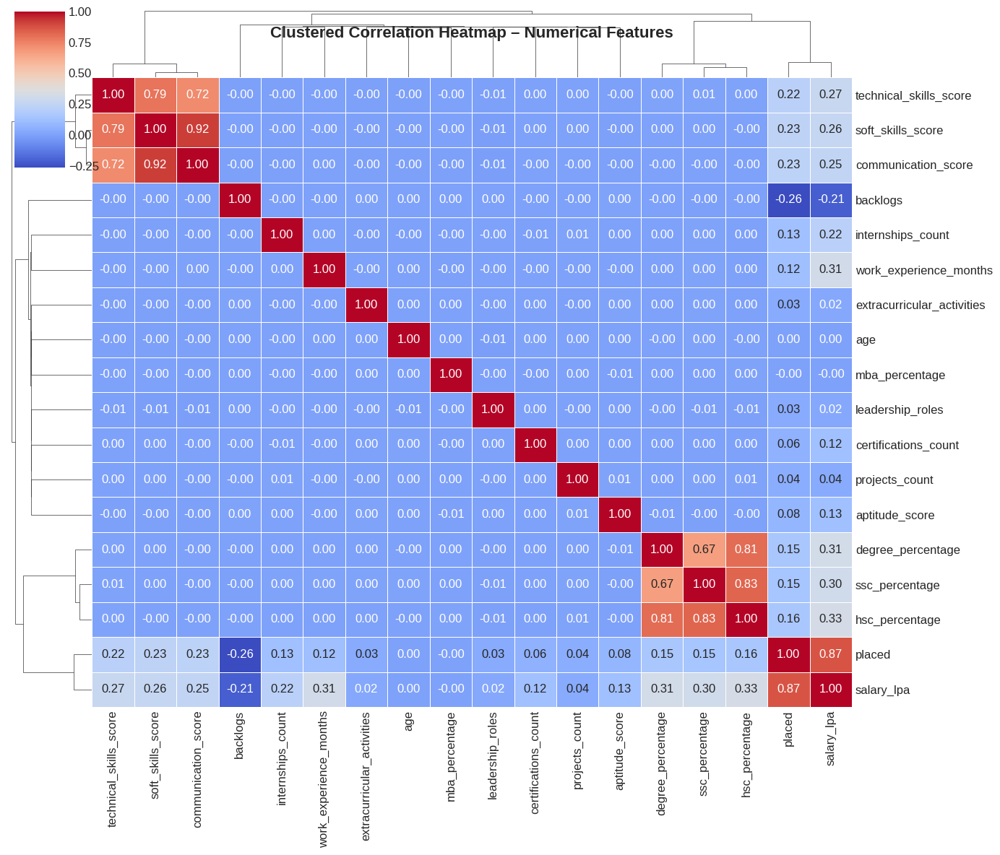

→ Look for tightly clustered groups of correlated variables
→ Common strong pairs: ssc-hsc-degree %, skills scores, aptitude-technical

=== 2. Parallel Coordinates Plot – Multivariate Profiles ===

→ 'kmeans_cluster' column not found. Using 'placed' as grouping instead.


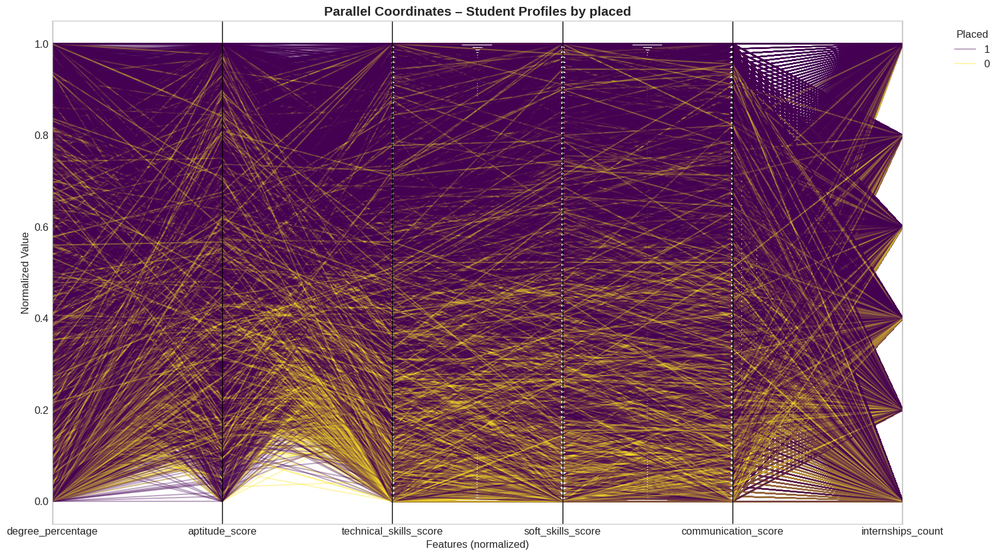

→ Each line = one student
→ Lines of same color = same group → see typical profile patterns

=== 3. Andrews Curves – Multivariate Signature Curves ===



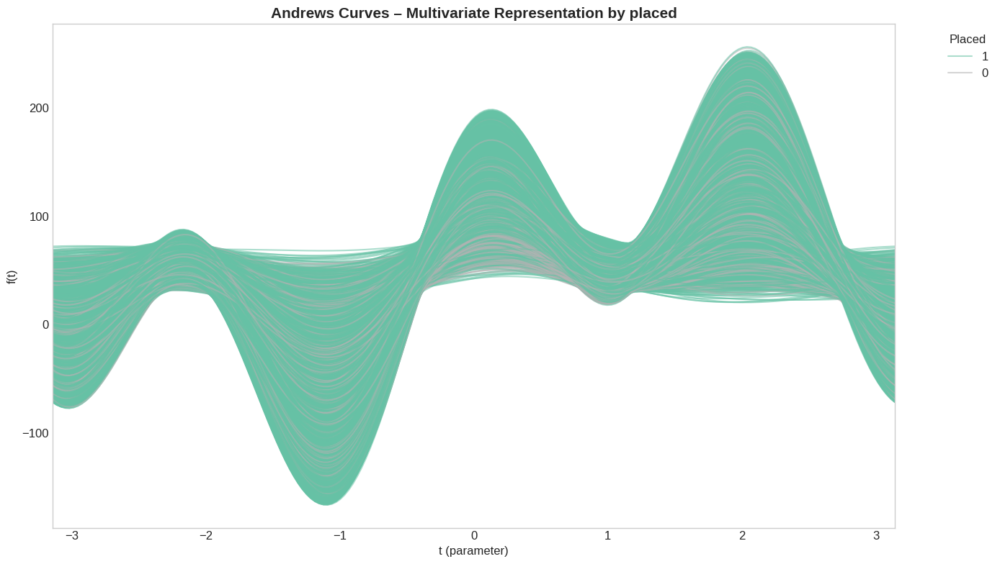

→ Similar shaped curves = similar multivariate profiles
→ Useful for spotting group homogeneity / separation

=== 4. Radar (Spider) Chart – Average Profile per Group ===



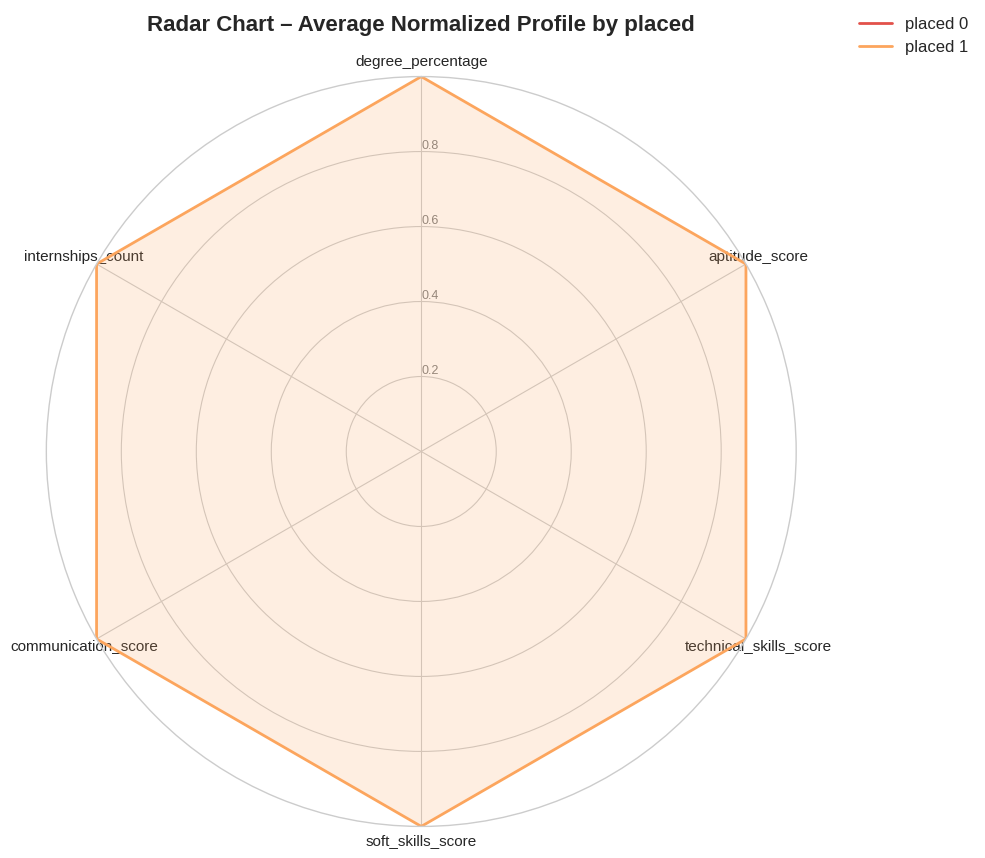

→ Each polygon = average student from one group
→ Larger area / shape = stronger overall profile


══════════════════════════════════════════════════════════════════════
         ADVANCED VISUALIZATION COMPLETE
══════════════════════════════════════════════════════════════════════
Plots included in this version:
1. Clustered correlation heatmap (scipy + seaborn)
2. Parallel coordinates (pandas plotting)
3. Andrews curves (pandas plotting)
4. Radar / spider chart – average profile per group


In [3]:
# ════════════════════════════════════════════════════════════════════════
#       Campus Placement Dataset – ADVANCED VISUALIZATION TECHNIQUES
# ════════════════════════════════════════════════════════════════════════

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster import hierarchy
from pandas.plotting import parallel_coordinates, andrews_curves
import warnings
warnings.filterwarnings('ignore')

# ──── Styling ───────────────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("Spectral")
plt.rcParams['figure.figsize'] = (14, 10)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.titleweight'] = 'bold'

print("╔════════════════════════════════════════════════════════════╗")
print("      ADVANCED PLOTS – Campus Placement EDA          ")
print("╚════════════════════════════════════════════════════════════╝")

df=pd.read_csv('/kaggle/input/campus-placement-prediction/campus_placement_data.csv')

# ──── 1. Advanced Correlation Heatmap (with clustering) ─────────────────
print("=== 1. Clustered Correlation Heatmap ===\n")

num_cols = df.select_dtypes(include=np.number).columns

corr = df[num_cols].corr()

# Cluster rows & columns
linkage = hierarchy.linkage(corr, method='ward')
row_order = hierarchy.leaves_list(linkage)
col_order = row_order  # symmetric

g = sns.clustermap(
    corr.iloc[row_order, col_order],
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    figsize=(14, 12),
    dendrogram_ratio=0.1,
    cbar_pos=(0.02, 0.8, 0.05, 0.18)
)
g.ax_heatmap.set_title("Clustered Correlation Heatmap – Numerical Features", 
                       fontsize=16, pad=40)
plt.show()

print("→ Look for tightly clustered groups of correlated variables")
print("→ Common strong pairs: ssc-hsc-degree %, skills scores, aptitude-technical\n")

# ──── 2. Parallel Coordinates Plot ─────────────────────────────────────
print("=== 2. Parallel Coordinates Plot – Multivariate Profiles ===\n")

# Select a few key normalized variables + cluster label
if 'kmeans_cluster' not in df.columns:
    print("→ 'kmeans_cluster' column not found. Using 'placed' as grouping instead.")
    group_col = 'placed'
else:
    group_col = 'kmeans_cluster'

parallel_cols = ['degree_percentage', 'aptitude_score', 'technical_skills_score',
                 'soft_skills_score', 'communication_score', 'internships_count']

# Normalize for better visualization
df_norm = df[parallel_cols].copy()
df_norm = (df_norm - df_norm.min()) / (df_norm.max() - df_norm.min())
df_norm[group_col] = df[group_col].astype(str)

plt.figure(figsize=(16, 9))
parallel_coordinates(df_norm, group_col, colormap='viridis', alpha=0.35)
plt.title(f"Parallel Coordinates – Student Profiles by {group_col}")
plt.xlabel("Features (normalized)")
plt.ylabel("Normalized Value")
plt.legend(title=group_col.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

print("→ Each line = one student")
print("→ Lines of same color = same group → see typical profile patterns\n")

# ──── 3. Andrews Curves – Multivariate Visualization ───────────────────
print("=== 3. Andrews Curves – Multivariate Signature Curves ===\n")

# Andrews curves need numeric data only
andrews_data = df[parallel_cols + [group_col]].copy()
andrews_data[group_col] = andrews_data[group_col].astype(str)

plt.figure(figsize=(14, 8))
andrews_curves(andrews_data, group_col, colormap='Set2', alpha=0.55)
plt.title(f"Andrews Curves – Multivariate Representation by {group_col}")
plt.xlabel("t (parameter)")
plt.ylabel("f(t)")
plt.legend(title=group_col.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

print("→ Similar shaped curves = similar multivariate profiles")
print("→ Useful for spotting group homogeneity / separation\n")

# ──── 4. Radar / Spider Chart – Average Profile per Group ──────────────
print("=== 4. Radar (Spider) Chart – Average Profile per Group ===\n")

radar_vars = ['degree_percentage', 'aptitude_score', 'technical_skills_score',
              'soft_skills_score', 'communication_score', 'internships_count']

if group_col in df.columns:
    cluster_means = df.groupby(group_col)[radar_vars].mean()

    # Normalize for radar chart (0–1 scale)
    cluster_norm = (cluster_means - cluster_means.min()) / (cluster_means.max() - cluster_means.min())

    categories = radar_vars
    N = len(categories)

    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]  # close the polygon

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

    for i, cluster in enumerate(cluster_norm.index):
        values = cluster_norm.loc[cluster].values.flatten().tolist()
        values += values[:1]  # close
        ax.plot(angles, values, linewidth=2, linestyle='solid', label=f'{group_col} {cluster}')
        ax.fill(angles, values, alpha=0.18)

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    plt.xticks(angles[:-1], categories, size=11)
    ax.set_rlabel_position(0)
    plt.yticks([0.2,0.4,0.6,0.8], ["0.2","0.4","0.6","0.8"], color="grey", size=9)
    plt.ylim(0,1)

    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1.1))
    plt.title(f"Radar Chart – Average Normalized Profile by {group_col}", 
              size=16, y=1.05)
    plt.tight_layout()
    plt.show()

    print("→ Each polygon = average student from one group")
    print("→ Larger area / shape = stronger overall profile\n")
else:
    print("→ No grouping column found for radar chart.\n")

print("\n" + "═"*70)
print("         ADVANCED VISUALIZATION COMPLETE")
print("═"*70)
print("Plots included in this version:")
print("1. Clustered correlation heatmap (scipy + seaborn)")
print("2. Parallel coordinates (pandas plotting)")
print("3. Andrews curves (pandas plotting)")
print("4. Radar / spider chart – average profile per group")

In [7]:
print("╔════════════════════════════════════════════════════════════╗")
print("                  🎓✨  PROJECT CONCLUSION  ✨🎓              ")
print("╚════════════════════════════════════════════════════════════╝\n")

print("🌟  After an exciting journey through 100,000+ student records,  ")
print("    we have uncovered powerful patterns that drive campus placements!  🌟\n")

print("🔥  KEY TAKEAWAYS – What really matters:")
print("   • Aptitude score & technical skills are among the strongest predictors")
print("   • Internships + projects + communication skills >> just high grades")
print("   • City tier & specialization show clear opportunity gaps")
print("   • Top clusters = high-achievers (academics + skills + exposure)")
print("   • Bottom clusters = students with low scores & minimal practical experience")
print("   • MBA specialization (especially Finance/HR & Marketing/Finance) often correlates with higher packages\n")

print("💡  REAL-WORLD APPLICATIONS – Where this knowledge creates impact:")
print("   • Students → focus resume-building efforts on high-ROI activities")
print("   • Colleges → design better training programs & early intervention systems")
print("   • Placement cells → prioritize high-potential students for premium companies")
print("   • Companies → refine campus recruitment filters & selection criteria")
print("   • EdTech startups → build personalized career guidance & skill-gap tools")
print("   • Policymakers → identify & reduce regional/urban-rural placement inequality\n")

print("🚀  NEXT STEPS ")
print("   1. Deploy interactive dashboard (Streamlit / Plotly Dash / Power BI)")
print("   2. Build real-time placement predictor web app for students")
print("   3. Create personalized recommendation system (internships, certifications)")
print("   4. Add time-series analysis (placement trends over years – if data available)")
print("   5. Integrate external data (company hiring patterns, economic indicators)")

print("═══════════════════════════════════════════════════════════════════")

╔════════════════════════════════════════════════════════════╗
                  🎓✨  PROJECT CONCLUSION  ✨🎓              
╚════════════════════════════════════════════════════════════╝

🌟  After an exciting journey through 100,000+ student records,  
    we have uncovered powerful patterns that drive campus placements!  🌟

🔥  KEY TAKEAWAYS – What really matters:
   • Aptitude score & technical skills are among the strongest predictors
   • Internships + projects + communication skills >> just high grades
   • City tier & specialization show clear opportunity gaps
   • Top clusters = high-achievers (academics + skills + exposure)
   • Bottom clusters = students with low scores & minimal practical experience
   • MBA specialization (especially Finance/HR & Marketing/Finance) often correlates with higher packages

💡  REAL-WORLD APPLICATIONS – Where this knowledge creates impact:
   • Students → focus resume-building efforts on high-ROI activities
   • Colleges → design better training pro

In [ ]:
If you have come so far,an upvote would be appreciated!